# Disclaimer

The below notebook contains extreme toxic and obscene words. None of them are intentional. They are present only to understand the data distribution and feature engineering.

# Toxic Comment Classification

The aim of this jupyter notebook is to perform below operations on the jig-saw toxic comment classification dataset from kaggle:
<li> Exploratory Data Analysis </li>
<li> Feature Engineering </li>
<li> Machine Learning Train and Test </li>
<li> Performance Evaluation </li>


### Python Packages Import

In [223]:
# math operations
import numpy as np

# data r/w
import pandas as pd

# misc
import gc, time, warnings
from itertools import combinations

# stats
from scipy import sparse
import scipy.stats as ss

# vizualizations
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
import matplotlib_venn as venn
from prettytable import PrettyTable
import plotly.express as px
import plotly.offline as py
import plotly.graph_objs as go
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# language processing
import string, re, nltk
from nltk.corpus import stopwords
from nltk import pos_tag
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.tokenize import TweetTokenizer

# Feature Engineering
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.utils.validation import check_X_y, check_is_fitted
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import log_loss, confusion_matrix, classification_report
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split

# Model building
from scipy.sparse import hstack, vstack
from sklearn.pipeline import make_union
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_error, accuracy_score, roc_curve, auc
import tensorflow as tf

In [1]:
from IPython.display import Image

In [143]:
# settings
start_time = time.time()
color = sns.color_palette()
sns.set_style("dark")
eng_stopwords = set(stopwords.words("english"))
warnings.filterwarnings("ignore")

In [9]:
nltk.download('stopwords') # downloaded
nltk.download('punkt')
nltk.download('wordnet')

In [3]:
print(eng_stopwords,f"\nTotal stopwords - {len(eng_stopwords)}")

{'you', 's', 'aren', "couldn't", 'having', 'few', 'more', 'are', "hadn't", 'himself', "needn't", 'when', 'they', 'those', 'down', 'no', 'so', "didn't", 'some', "isn't", 'won', 'with', 'here', 'i', 'him', 'but', 'our', 'such', 'over', 'doing', 'same', 'should', 'up', "aren't", "doesn't", 'whom', 'again', "mustn't", 'not', 'other', 'any', 'been', 'yourself', 'most', 'them', 'herself', 'who', 'nor', 'his', 'before', 'y', 'ain', 'because', 'of', 'themselves', 'until', 'above', 'hasn', 'wasn', 're', 'me', 'and', 'she', 'if', 'for', 'was', 'by', "weren't", "hasn't", 'o', 'mightn', "you're", 'after', 'had', 'their', 'just', "she's", 'each', 'll', 'have', 'couldn', 'through', 'needn', 'am', 'on', 'too', 'at', 'all', 'once', "you've", 'yourselves', 'that', 'against', 'did', 'ourselves', 'how', 'it', 'what', 'be', 'ours', 'these', 'wouldn', 'to', 'her', "that'll", 'ma', 'weren', 'there', "haven't", "won't", 'own', 'will', 'do', 'an', 'which', 'has', 'into', 'we', 'under', 'your', 'further', 'whe

Stopwords are the most frequently used words in the english conversations.

In [3]:
lem = WordNetLemmatizer() # lemmatizer brings down a word to its root
tokenizer = TweetTokenizer()

In [4]:
%matplotlib inline

# Data Overview

In [5]:
train = pd.read_csv(r"../data/train.csv")
test = pd.read_csv(r"../data/test.csv")

In [6]:
train.head(10)

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,0000997932d777bf,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0
1,000103f0d9cfb60f,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0
2,000113f07ec002fd,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0
3,0001b41b1c6bb37e,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0
4,0001d958c54c6e35,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0
5,00025465d4725e87,"""\n\nCongratulations from me as well, use the ...",0,0,0,0,0,0
6,0002bcb3da6cb337,COCKSUCKER BEFORE YOU PISS AROUND ON MY WORK,1,1,1,0,1,0
7,00031b1e95af7921,Your vandalism to the Matt Shirvington article...,0,0,0,0,0,0
8,00037261f536c51d,Sorry if the word 'nonsense' was offensive to ...,0,0,0,0,0,0
9,00040093b2687caa,alignment on this subject and which are contra...,0,0,0,0,0,0


In [7]:
train.describe()

,toxic,severe_toxic,obscene,threat,insult,identity_hate
count,159571.000000,159571.000000,159571.000000,159571.000000,159571.000000,159571.000000
mean,0.095844,0.009996,0.052948,0.002996,0.049364,0.008805
std,0.294379,0.099477,0.223931,0.054650,0.216627,0.093420
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [9]:
print(train.shape)

(159571, 8)


There are 159571 rows in train data and 8 columns

In [10]:
print(test.shape)

(153164, 2)


There are 153164 rows in test data and 2 columns

##### checking for Null Values

In [11]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 159571 entries, 0 to 159570
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   id             159571 non-null  object
 1   comment_text   159571 non-null  object
 2   toxic          159571 non-null  int64 
 3   severe_toxic   159571 non-null  int64 
 4   obscene        159571 non-null  int64 
 5   threat         159571 non-null  int64 
 6   insult         159571 non-null  int64 
 7   identity_hate  159571 non-null  int64 
dtypes: int64(6), object(2)
memory usage: 9.7+ MB


Two features - id, comment_text <br>
6 Labels - toxic, severe_toxic, obscene, threat, insult, identity_hate

**No NULL values** in the train data

##### checking for duplicates

In [12]:
train["comment_text"].duplicated().value_counts()

False    159571
Name: comment_text, dtype: int64

There are **no duplicate comments**, when looked from a birds eyeview

In [8]:
train_df = train.copy() # duplicate

##### Understanding the data distribution

- Adding a new label called "clean" - when a comment is not classified into any of the pre given classes, considering it as clean

In [9]:
# class distribution
class_distb = train_df.iloc[:,2:].sum()
# clean comments
row_sums = train_df.iloc[:,2:].sum(axis=1)
# new label clean
train_df["clean"] = (row_sums == 0)

# viz
table = PrettyTable()
table.add_row(["Total Comments", train_df.shape[0]])
table.add_row(["Total clean comments", train_df["clean"].sum()])
table.add_row(["Total labels", class_distb.sum()])

print(table)

+----------------------+---------+
|       Field 1        | Field 2 |
+----------------------+---------+
|    Total Comments    |  159571 |
| Total clean comments |  143346 |
|     Total labels     |  35098  |
+----------------------+---------+


The above table clearly shows that the label distribution is extremely skewed and imbalanced

In [15]:
print(train_df.columns)

Index(['id', 'comment_text', 'toxic', 'severe_toxic', 'obscene', 'threat',
       'insult', 'identity_hate', 'clean'],
      dtype='object')


In [54]:
COLUMNS = ["toxic", "severe_toxic", "obscene", "threat", "insult", "identity_hate", "clean"]

####  Exploring class distribution

In [18]:
label_df = pd.DataFrame(train_df[COLUMNS].sum(axis=0)).reset_index()
label_df["Label"] = label_df["index"]
label_df["Comments Count"] = label_df[0]
label_df = label_df.sort_values(0, ascending=False)
fig = px.bar(label_df, x="Label", y="Comments Count", 
             title="Comments per Label",
            color = "Comments Count",
            text = "Comments Count")
fig.update_traces(textposition="outside")
fig.show()


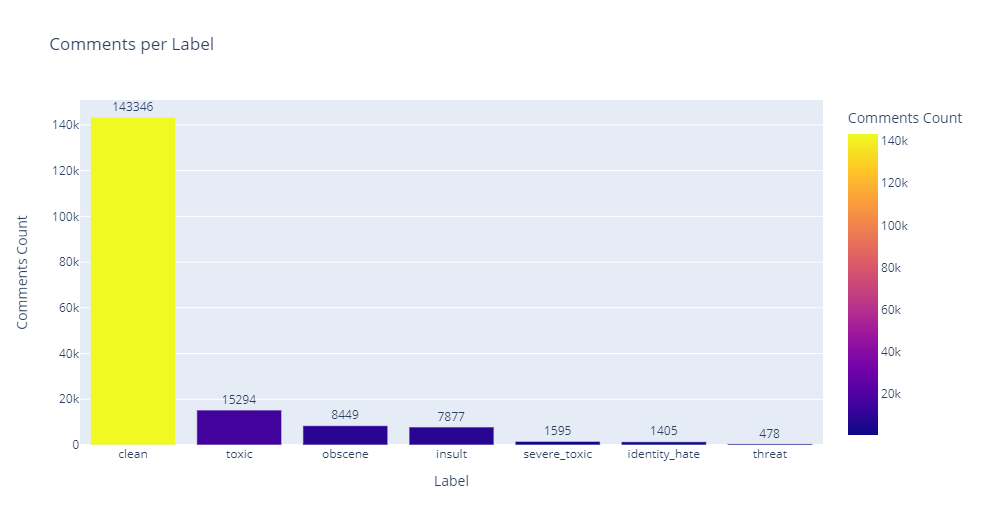

In [9]:
Image(filename=os.path.join(os.getcwd(), r"..\visualizations\bar graphs\1.Comments per label.png")) 

From above plot it is clearly evident that data is highly skewed due to extreme class imbalance with 89% clean data and 11% rest

In [10]:
non_clean = train_df.shape[0] - train_df["clean"].sum()
print(f"Number of Toxic Comments {non_clean}")

Number of Toxic Comments 16225


In [11]:
toxicity_tags = train_df.iloc[:,2:-1].sum()
print(toxicity_tags)

toxic            15294
severe_toxic      1595
obscene           8449
threat             478
insult            7877
identity_hate     1405
dtype: int64


Well the dataset says only 16225 toxic comments, but the number of tags clearly are more in number.
=> Only possible reason is presence of multiple tags per comment

#### Labels per comment

In [21]:
label_df = pd.DataFrame(train.iloc[:,2:].sum(axis=1).value_counts())
label_df["Num Labels in a Comment"] = label_df.index
label_df["Comments Count"] = label_df[0]
label_df = label_df.sort_values(0, ascending=False)

fig = px.bar(label_df, x="Num Labels in a Comment", y="Comments Count", 
             title="Number of Labels assigned to a Comment",
            color = "Comments Count",
            text = "Comments Count")
fig.update_traces(textposition="outside")
fig.show()

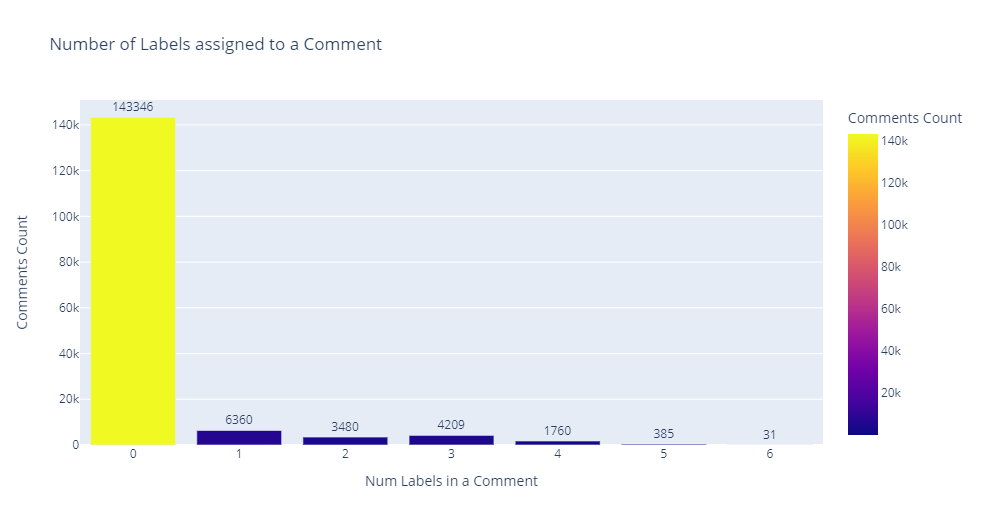

In [10]:
Image(filename=os.path.join(os.getcwd(), r"..\visualizations\bar graphs\2.num labels per comment.png")) 

In [22]:
del label_df # removing unwanted df

#### Label correlation

**Correlation** is the degree to which two values are linearly related. Note correlation doesn't imply causation.

**Correlation coefficient** is a statistical measure of the strength of the relatioship between the relative movements of two variables

value => -1 => Perfect Negative Correlation<br/>
value => 1 => Perfect Positive Correlation<br/>
value => 0 => No linear Relationship

<table>
    <tr>
        <th>Pearson Correlation Coefficient</th>
        <th>Spearman Rank Correlation Coefficient</th>
    </tr>
    <tr>
        <td>Pearson correlation coefficient also referred to as Pearson’s r or the bivariate correlation is a statistic that measures the linear correlation between two variables X and Y</td>
        <td>Spearman’s rank correlation coefficient or Spearman’s ρ, named after Charles Spearman is a nonparametric measure of rank correlation (statistical dependence between the rankings of two variables). It assesses how well the relationship between two variables can be described using a monotonic function.</td>
</table>

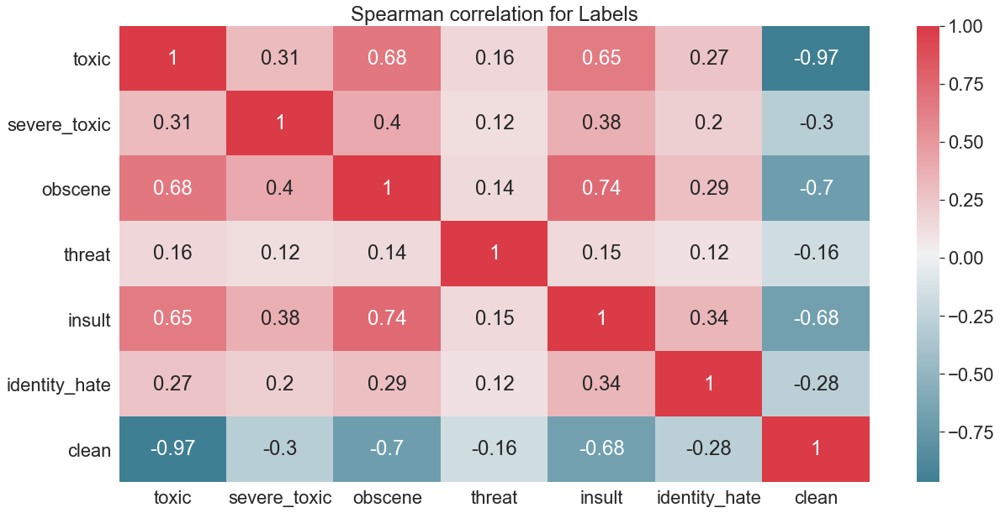

In [23]:
corr = train_df.corr(method="spearman")
sns.set(font_scale=2)
f, ax = plt.subplots(figsize=(20,10))
ax.set_title("Spearman correlation for Labels")
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr, cmap=cmap, annot=True)

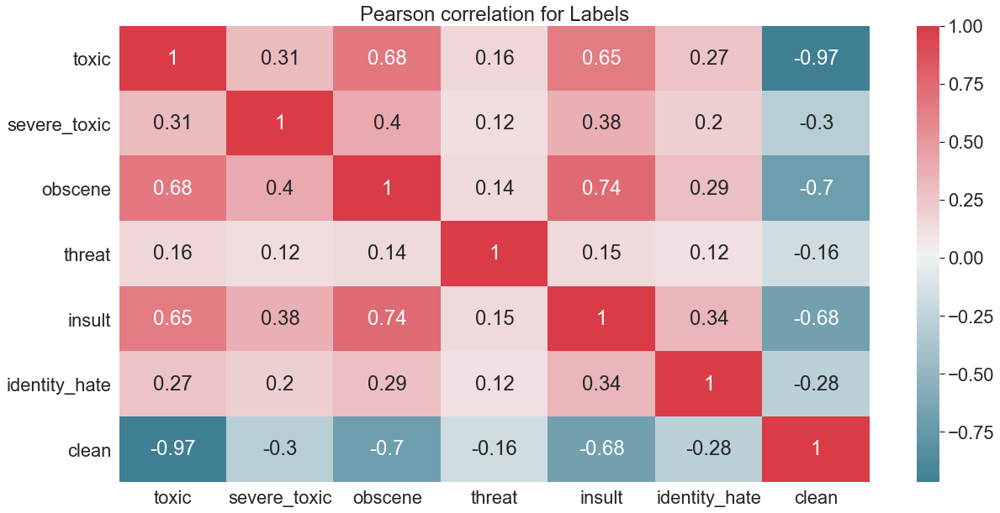

In [24]:
corr = train_df.corr(method="pearson")
sns.set(font_scale=2)
f, ax = plt.subplots(figsize=(20,10))
ax.set_title("Pearson correlation for Labels")
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr, cmap=cmap, annot=True)

No difference in Pearson vs Spearman correlation

Observations:</br>
1. "toxic" is strongly correlated with "obscene" and "insult" with value over 0.65</br>
2. "insult" and "obscene" are strongly correlated with a value of 0.74



In [27]:
def tox_ins_obs(t=False, i=False, o=False, df=train_df):
    return df[
        (df["toxic"] == t) &
        (df["insult"] == i) &
        (df["obscene"] == o)
    ].shape[0]

In [28]:
# toxic <=> obscene <=> insult
just_toxic = tox_ins_obs(t=True)
just_insult = tox_ins_obs(i=True)
just_obscene = tox_ins_obs(o=True)

tox_ins = tox_ins_obs(t=True,i=True)
tox_obs = tox_ins_obs(t=True, o=True)
ins_obs = tox_ins_obs(i=True, o=True)

tox_ins_obs = tox_ins_obs(t=True, i=True, o=True)

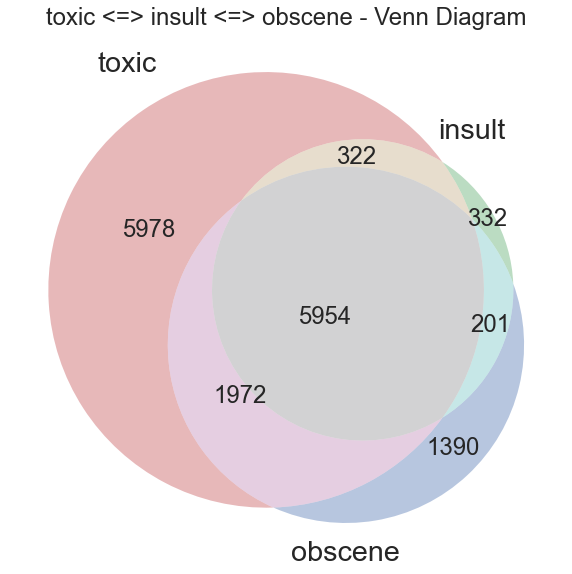

In [29]:
plt.figure(figsize=(10,10))
plt.title("toxic <=> insult <=> obscene - Venn Diagram")
venn.venn3(
    subsets = (just_toxic, just_insult, just_obscene, tox_ins, tox_obs, ins_obs, tox_ins_obs),
    set_labels = ("toxic", "insult", "obscene")
)
plt.show()

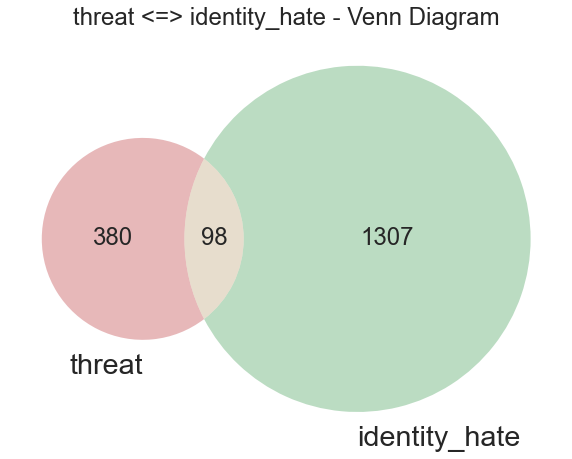

In [30]:
th = train_df[
    (train_df["threat"] == 1) &
    (train_df["identity_hate"] == 0)
].shape[0]

ih = train_df[
    (train_df["threat"] == 0) &
    (train_df["identity_hate"] == 1)
].shape[0]

th_ih = train_df[
    (train_df["threat"] == 1) &
    (train_df["identity_hate"] == 1)
].shape[0]

plt.figure(figsize=(10,10))
plt.title("threat <=> identity_hate - Venn Diagram")
venn.venn2(
    subsets = (th, ih, th_ih),
    set_labels = ("threat", "identity_hate")
)
plt.show()

In [31]:
tox = train_df[
    (train_df["toxic"] == 1) &
    (train_df["severe_toxic"] == 0)
].shape[0]

sev = train_df[
    (train_df["toxic"] == 0) &
    (train_df["severe_toxic"] == 1)
].shape[0]

tox_sev = train_df[
    (train_df["toxic"] == 1) &
    (train_df["severe_toxic"] == 1)
].shape[0]

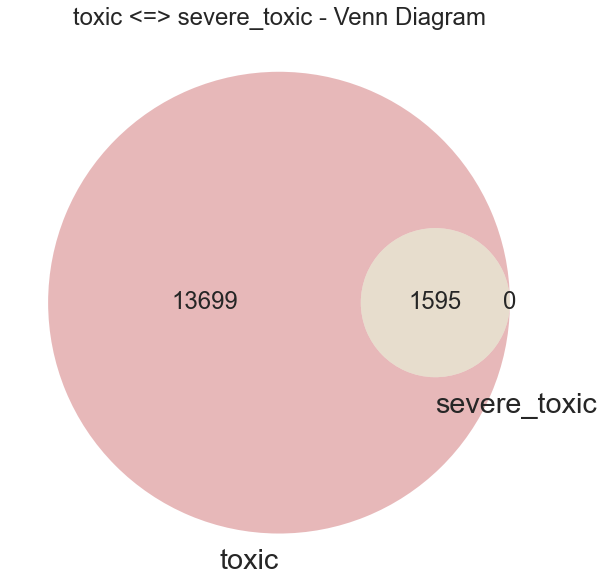

In [32]:
plt.figure(figsize=(10,10))
plt.title("toxic <=> severe_toxic - Venn Diagram")
venn.venn2(
    subsets = (tox, sev, tox_sev),
    set_labels = ("toxic", "severe_toxic")
)
plt.show()

### Cross tab between classes to find patterns

In [33]:
def emphasize_low(data, col="red"):
    attr = f"background-color: {col}"
    if data.ndim == 1:
        return [attr if value else "" for value in data==data.min()]
    else:
        return pd.DataFrame(np.where(data==data.min().min(), attr, "",
                                    index=data.index, columns=data.columns))

In [34]:
correlation_matrix = []
for label in train_df.columns[3:-1]:
    confusion_matrix_ = pd.crosstab(train_df["toxic"], train_df[label])
    correlation_matrix.append(confusion_matrix_)
    
cross_tab = pd.concat(correlation_matrix,axis=1, keys=train_df.columns[3:-1])
cross_tab.style.apply(emphasize_low, axis=0)

<ul>
    Observation:
    <li>If a comment is **severe_toxic** then it is definetly **toxic**</li>
</ul>


## Exploring Data samples

In [35]:
for label in COLUMNS:
    print(f"{label} samples")
    print(train_df[train_df[label] == 1].iloc[1,1])
    print("-"*75)

toxic samples
Hey... what is it..
@ | talk .
What is it... an exclusive group of some WP TALIBANS...who are good at destroying, self-appointed purist who GANG UP any one who asks them questions abt their ANTI-SOCIAL and DESTRUCTIVE (non)-contribution at WP?

Ask Sityush to clean up his behavior than issue me nonsensical warnings...
---------------------------------------------------------------------------
severe_toxic samples
Stupid peace of shit stop deleting my stuff asshole go die and fall in a hole go to hell!
---------------------------------------------------------------------------
obscene samples
You are gay or antisemmitian? 

Archangel WHite Tiger

Meow! Greetingshhh!

Uh, there are two ways, why you do erased my comment about WW2, that holocaust was brutally slaying of Jews and not gays/Gypsys/Slavs/anyone...

1 - If you are anti-semitian, than shave your head bald and go to the skinhead meetings!

2 - If you doubt words of the Bible, that homosexuality is a deadly sin, mak

### top 50 (Uncleaned) Word frequencies

In [36]:
uncleaned_all_words = train_df["comment_text"].str.split(expand=True).unstack().value_counts()
print(len(uncleaned_all_words))

532299


In [37]:
data = [go.Bar(
        x = uncleaned_all_words.index.values[2:50],
        y = uncleaned_all_words.values[2:50],
        marker = dict(colorscale="Jet",
                     color = uncleaned_all_words.values[2:100]),
        text = "Word counts"
)]

layout = go.Layout(
    title='Top 50 (Uncleaned) Word frequencies in the dataset'
)

fig = go.Figure(data=data, layout=layout)

py.iplot(fig, filename='basic-bar')

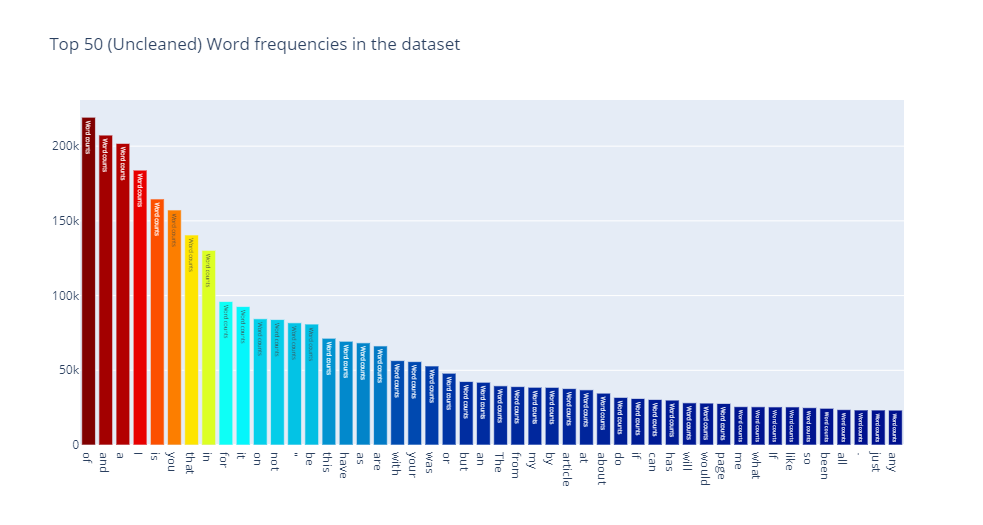

In [11]:
Image(filename=os.path.join(os.getcwd(), r"..\visualizations\bar graphs\3.Top 50 words - unprocessed data.png")) 

The above plot doesn't make much sense,because the mentioned words are so commonly used which can be found in any piece of text. Hence it is essential to preprocess the data and then visualize the commonly occuring words

In [38]:
del uncleaned_all_words

In [49]:
token_cmnts = train_df.comment_text.str.split()
sent_lengths = [len(comment) for comment in token_cmnts]

In [43]:
px.histogram(sent_lengths,title="Number of words in comments - Histogram")

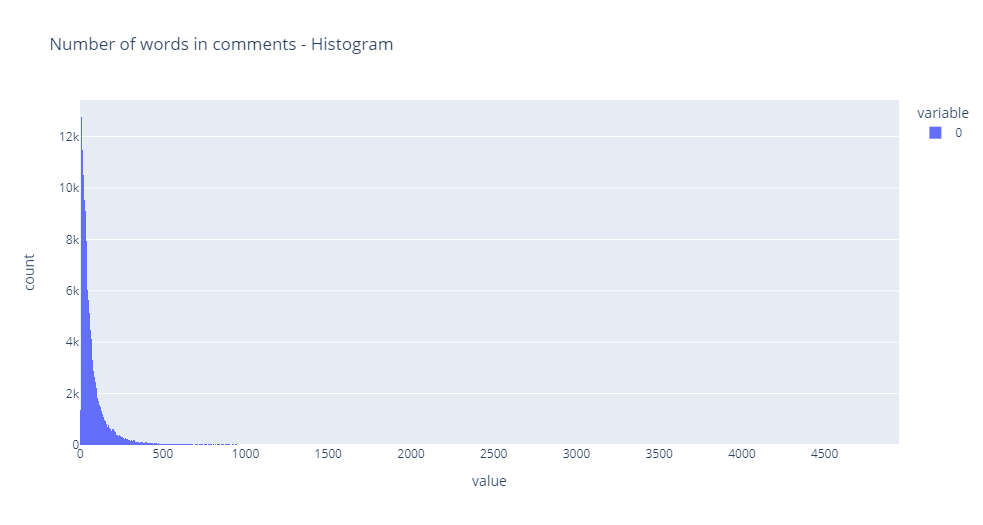

In [13]:
Image(filename=os.path.join(os.getcwd(), r"..\visualizations\histograms\Word Count - un processed text.png")) 

Most comments length lie under 500 words, very few comments are extremely large

In [50]:
train_df["comment_text"][np.argmin(sent_lengths)]

'(www.ebenefits.va.gov)'

In [51]:
train_df["comment_text"][np.argmax(sent_lengths)]

'I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM AN LOSER == == I AM AN LOSER ==== I AM 

The above text is one good example of why we need thorough preprocessing

In [52]:
del sent_lengths

### WORD CLOUDS

Word clouds are great way of representing most frequent words under a class label.

In [53]:
def generate_word_clouds(label, colormap="viridis"):
    text = train_df[train_df[label] == True].comment_text.values
    word_cloud = WordCloud(background_color="black",
                      max_words=2000,
                      stopwords=eng_stopwords)
    word_cloud.generate(" ".join(text))
    
    # plot
    plt.figure(figsize=(20,10))
    plt.axis("off")
    plt.title(f"Frequent words in {label.upper()} comments", fontsize=20)
    plt.imshow(word_cloud.recolor(colormap=colormap, random_state=42))
    plt.show()

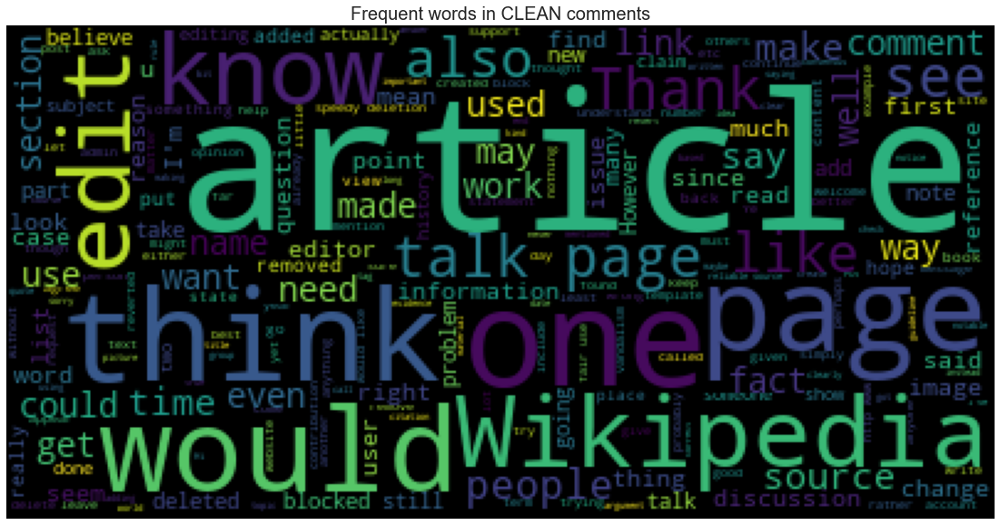

In [54]:
generate_word_clouds("clean")

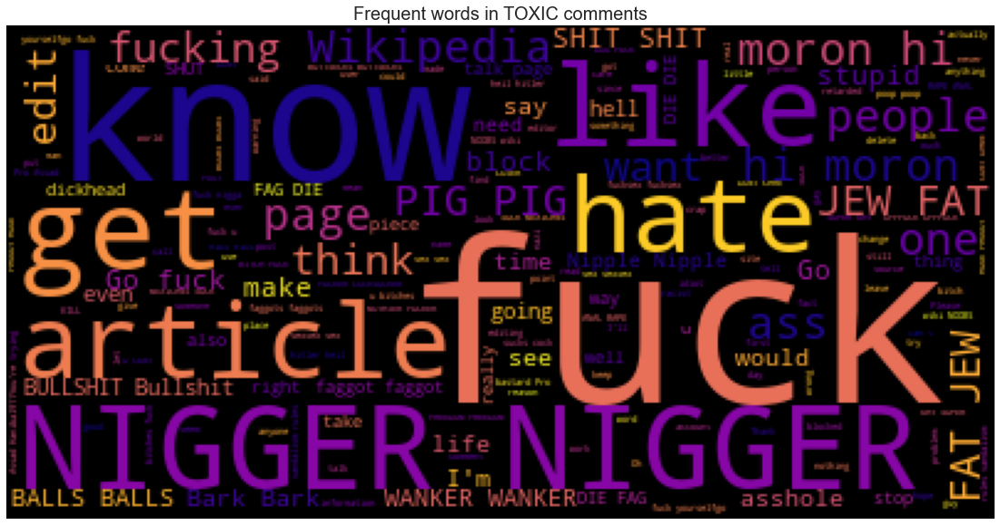

In [50]:
generate_word_clouds("toxic", "plasma")

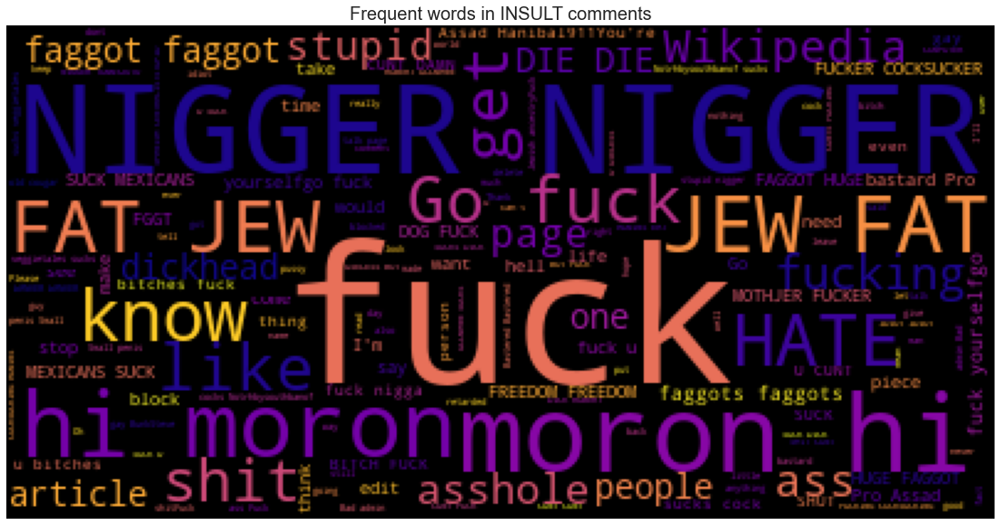

In [51]:
generate_word_clouds("insult", "plasma")

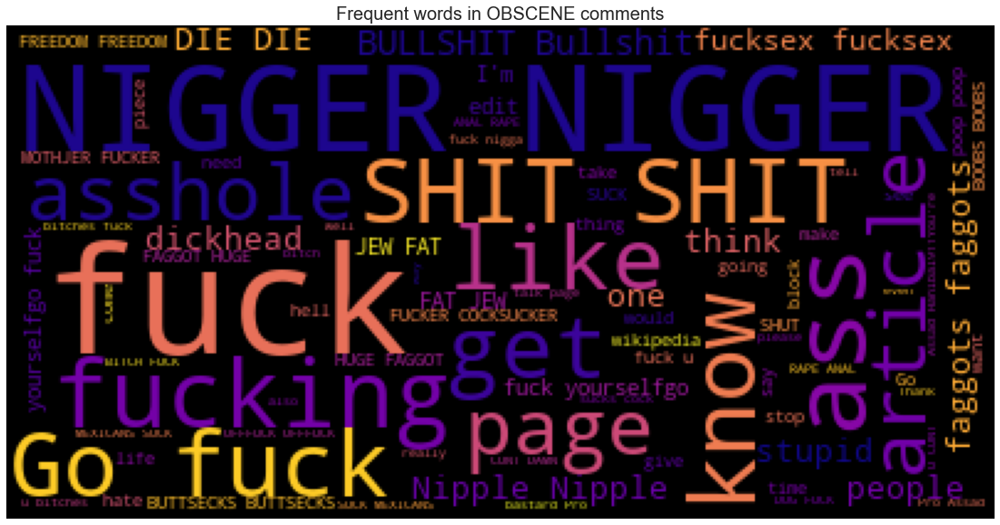

In [52]:
generate_word_clouds("obscene", "plasma")

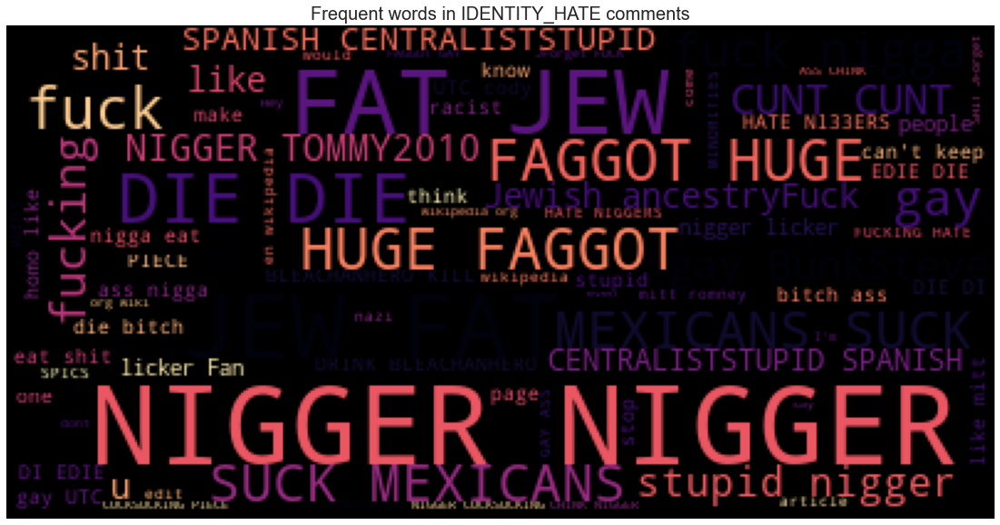

In [53]:
generate_word_clouds("identity_hate", "magma")

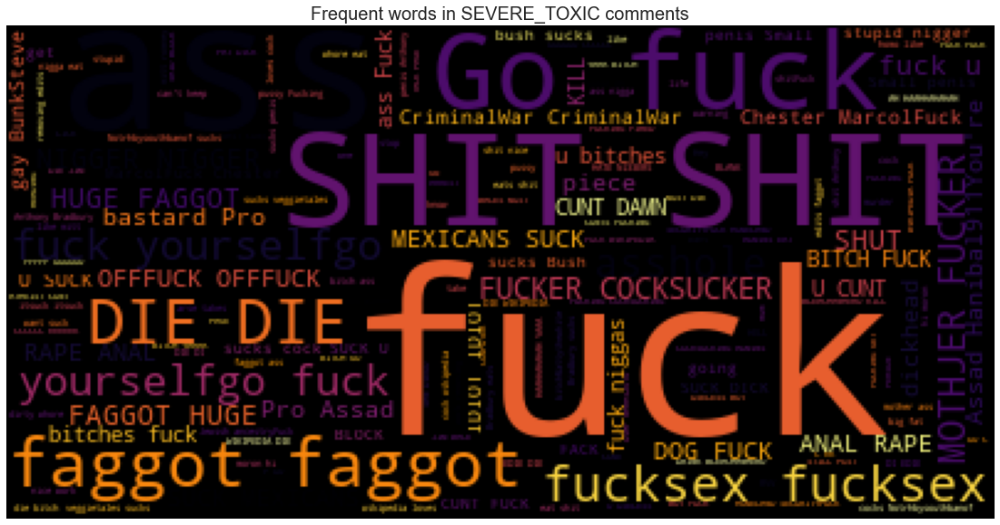

In [54]:
generate_word_clouds("severe_toxic", "inferno")

# Feature Engineering

Since the data is text, the following questions should help in coming up with new interesting features
(Note: here toxic refers to all toxic classes and clean referes to clean class)
1. Are toxic comments longer when compared with clean?
2. Does toxic comments contain more words?
3. Do people use unique words while abusing?
4. Which comments contain more punctuations (? ! .) toxic or clean?
5. Does capitalized text seen more often in toxic comments?
6. How often does stop words occur in toxic vs clean?
7. People often express using emojis. which emojis are prevalent Happy or sad or angry?

In [12]:
df = train_df.iloc[:,0:2].reset_index(drop=True)

In [13]:
# sentence count in each comment
df["sentence_count"] = df.comment_text.apply(lambda x:len(re.findall("\n",x))+1)

In [14]:
# word count in each comment
df["word_count"] = df.comment_text.apply(lambda x: len(x.split()))

In [15]:
# number of distinct words in each comment
df["distinct_word_count"] = df.comment_text.apply(lambda x: len(set(x.split())))

In [16]:
# number of letters in each comment
df["letter_count"] = df.comment_text.apply(lambda x: len(x))

In [17]:
# number of punctuations
df["punct_count"] = df.comment_text.apply(lambda x: len([c for c in x if c in string.punctuation]))

In [18]:
# number of upper case words
df["uppercase_count"] = df.comment_text.apply(lambda x: len([w for w in x.split() if w.isupper()]))

In [19]:
# number of upper case letter count
df["upper_letter_count"] = df.comment_text.apply(lambda x: sum(1 for c in x if c.isupper()))

In [20]:
# number of lower case words
df["lowercase_count"] = df.comment_text.apply(lambda x: len([w for w in x.split() if w.islower()]))

In [21]:
# number of title case words
df["titlecase_count"] = df.comment_text.apply(lambda x: len([w for w in x.split() if w.istitle()]))

In [22]:
# number of stopwords in comment
df["stopword_count"] = df.comment_text.apply(lambda x: len([w for w in x.lower().split() if w in eng_stopwords]))

In [23]:
# question marks count
df["question_count"] = df.comment_text.str.count("\?")

In [24]:
# exclamation marks count
df["exclamation_count"] = df.comment_text.str.count("!")

In [25]:
# smiley count
smilies = (':-)', ':)', ';-)', ';)', ':D')
df["smiley_count"] = df.comment_text.apply(lambda x: 
                                           sum(x.count(w) for w in smilies))

In [26]:
# sad count
saddies = (':-(', ':(', ';-(', ';(')
df["sad_count"] = df.comment_text.apply(lambda x: 
                                           sum(x.count(w) for w in saddies))

In [27]:
# average word length in comment
df["avg_word_len"] = df.comment_text.apply(lambda x: np.mean([len(w) for w in x.split()]))

In [28]:
# distinct word proportion
df["distinct_wrd_prop"] = df["distinct_word_count"]*100 / df["word_count"]

In [29]:
# punctuation proportion
df["punct_prop"] = df["punct_count"]*100 / df["word_count"]

In [31]:
train_features = df.iloc[0: len(train),]
train_tags = train_df.iloc[:,2:]
train_feats = pd.concat([train_features, train_tags], axis=1)

Let us visualize if the newly created features give any useful information

### Number of Sentences, Number of Words against Toxic - Clean

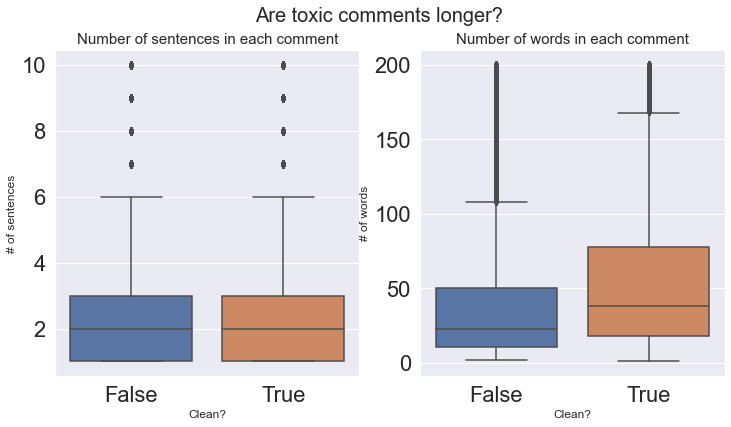

In [75]:
train_feats['sentence_count'].loc[train_feats['sentence_count']>10] = 10 
plt.figure(figsize=(12,6))
## sentenses
plt.subplot(121)
plt.suptitle("Are toxic comments longer?",fontsize=20)
sns.boxplot(y='sentence_count',x='clean', data=train_feats)
plt.xlabel('Clean?', fontsize=12)
plt.ylabel('# of sentences', fontsize=12)
plt.title("Number of sentences in each comment", fontsize=15)

## words
train_feats['word_count'].loc[train_feats['word_count']>200] = 200
plt.subplot(122)
sns.boxplot(y='word_count',x='clean', data=train_feats)
plt.xlabel('Clean?', fontsize=12)
plt.ylabel('# of words', fontsize=12)
plt.title("Number of words in each comment", fontsize=15)

plt.show()

Well boxplots aren't giving much of information. Lets try violin plots instead.

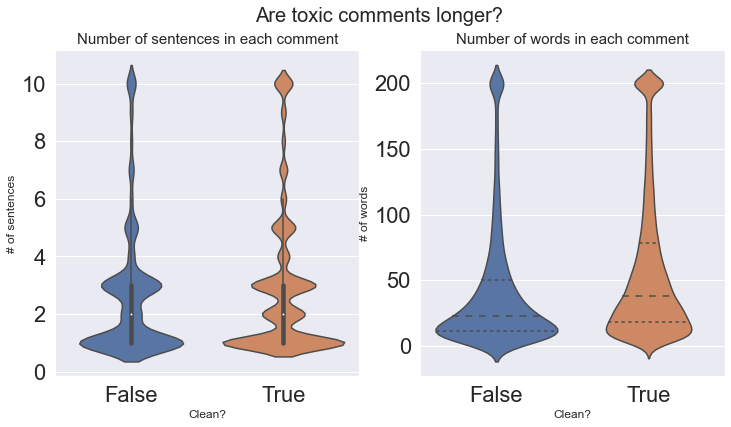

In [76]:
train_feats['sentence_count'].loc[train_feats['sentence_count']>10] = 10 
plt.figure(figsize=(12,6))
## sentenses
plt.subplot(121)
plt.suptitle("Are toxic comments longer?",fontsize=20)
sns.violinplot(y='sentence_count',x='clean', data=train_feats,split=True)
plt.xlabel('Clean?', fontsize=12)
plt.ylabel('# of sentences', fontsize=12)
plt.title("Number of sentences in each comment", fontsize=15)

## words
train_feats['word_count'].loc[train_feats['word_count']>200] = 200
plt.subplot(122)
sns.violinplot(y='word_count',x='clean', data=train_feats,split=True,inner="quart")
plt.xlabel('Clean?', fontsize=12)
plt.ylabel('# of words', fontsize=12)
plt.title("Number of words in each comment", fontsize=15)

plt.show()

Well longer sentences or more words do not signify much of toxicity either. But one observation is between 25 to 50 percentile, the volume of words in toxic comments is more than clean

No handles with labels found to put in legend.


Text(0.5, 0, 'Distinct Word proportion')

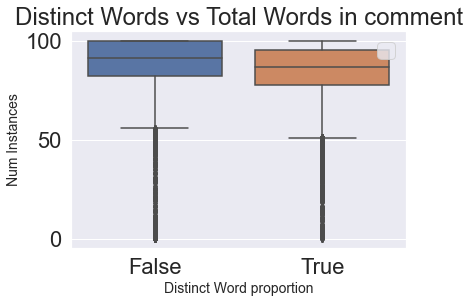

In [81]:
plt.title("Distinct Words vs Total Words in comment")
sns.boxplot(x='clean', y='distinct_wrd_prop', data=train_feats)
plt.legend()
plt.ylabel('Num Instances', fontsize=14)
plt.xlabel('Distinct Word proportion', fontsize=14)

Box plot is not giving much of information. Lets merge both classes and visualize.

Text(0.5, 0, 'Distinct Word proportion')

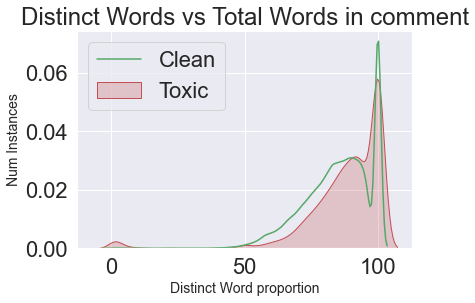

In [86]:
plt.title("Distinct Words vs Total Words in comment")
ax=sns.kdeplot(train_feats[train_feats.clean == 0].distinct_wrd_prop, label="Toxic",shade=True, color='r')
ax=sns.kdeplot(train_feats[train_feats.clean == 1].distinct_wrd_prop, label="Clean", color='g')
plt.legend()
plt.ylabel('Num Instances', fontsize=14)
plt.xlabel('Distinct Word proportion', fontsize=14)

From the kde plot we can see that there is quite a difference between means of Toxic and Clean classes

In [77]:
distinct_lessthan_10 = train_feats[train_feats["distinct_wrd_prop"]<10]
distinct_lessthan_20 = train_feats[train_feats["distinct_wrd_prop"]<20]
distinct_lessthan_30 = train_feats[train_feats["distinct_wrd_prop"]<30]
distinct_lessthan_40 = train_feats[train_feats["distinct_wrd_prop"]<40]

In [78]:
def plot_distinct_words_prop(data, prop):
    x = data.iloc[:, -7:].sum()
    plt.figure(figsize=(20,10))
    plt.title(f"Num comments with low ({prop}%) distinct words", fontsize=15)
    ax = sns.barplot(x = x.index, y = x.values, color = color[3])
    
    bars = ax.patches
    classes = x.values
    for r, l in zip(bars, classes):
        ht = r.get_height()
        ax.text(r.get_x() + r.get_width()/4, ht + 5, l, ha="center", va="bottom")
        
    plt.xlabel("TOXIC CLASS", fontsize=15)
    plt.ylabel("Number of comments", fontsize=15)
    plt.show()

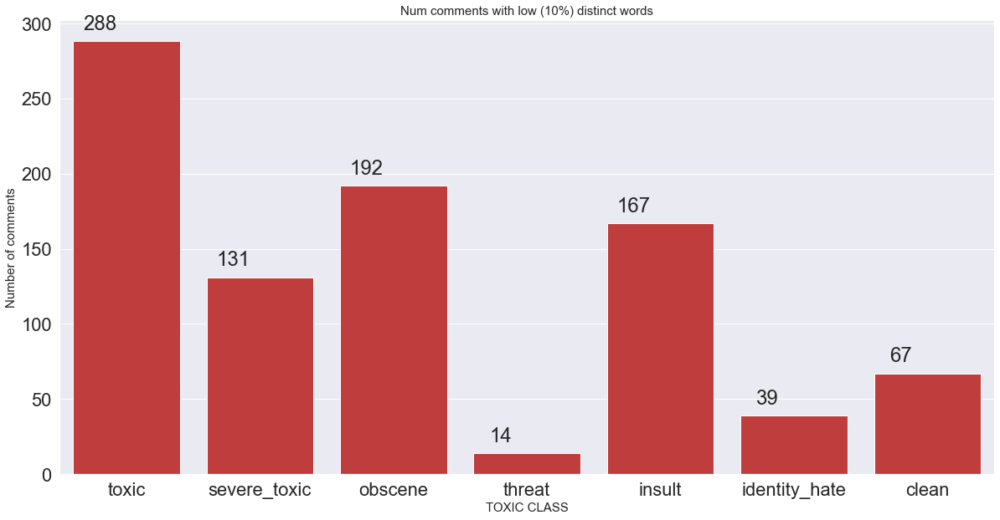

In [79]:
plot_distinct_words_prop(distinct_lessthan_10, 10)

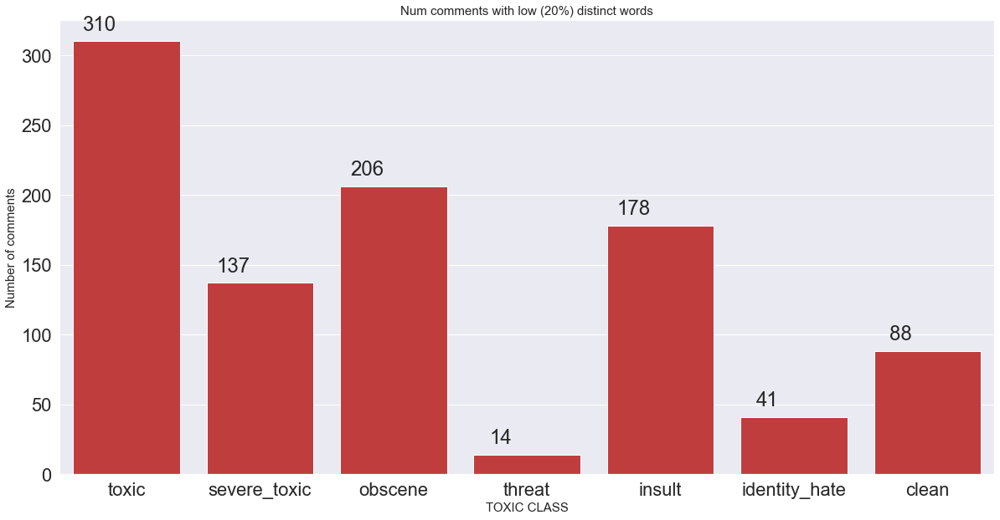

In [80]:
plot_distinct_words_prop(distinct_lessthan_20, 20)

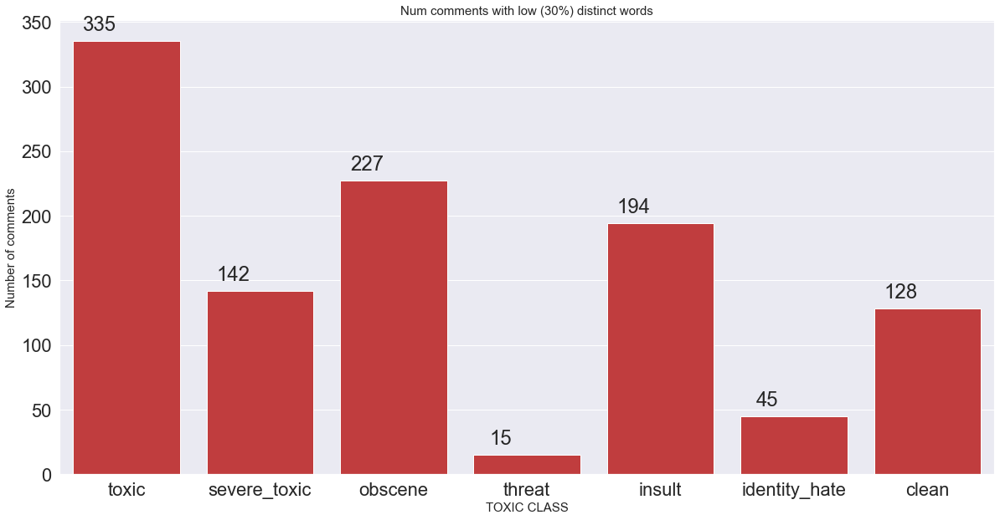

In [81]:
plot_distinct_words_prop(distinct_lessthan_30, 30)

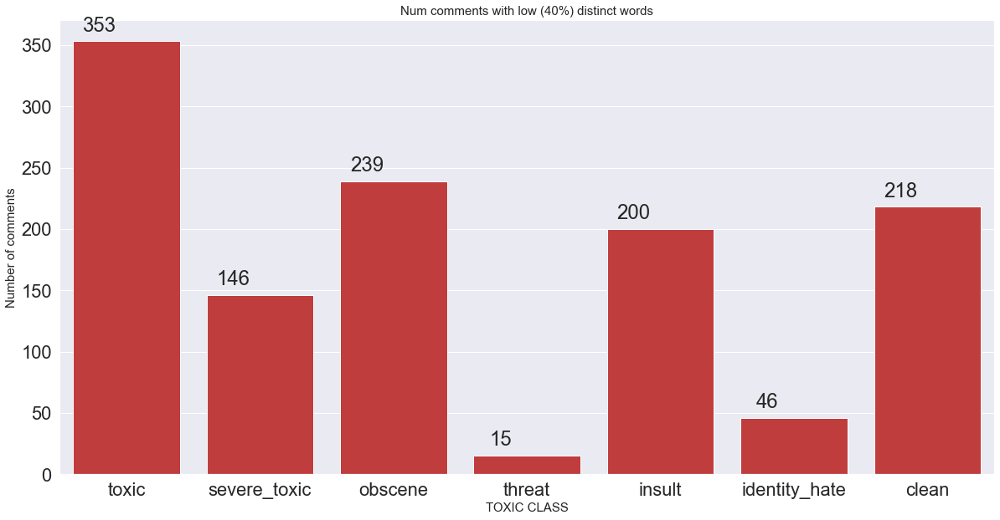

In [82]:
plot_distinct_words_prop(distinct_lessthan_40, 40)

In [79]:
print("Examples with less than 30 percent of unique words:")
print(distinct_lessthan_30[distinct_lessthan_30.clean==1].comment_text.iloc[1])

Examples with less than 30 percent of unique words:
Towns and Villages in Ark-La-Tex]]
 Cities, boroughs and towns in the Republic of Ireland
 Cities, boroughs, and townships along the Susquehanna River
 Cities, towns and villages in Alborz Province
 Cities, towns and villages in Ardabil Province
 Cities, towns and villages in Bhutan
 Cities, towns and villages in Bushehr Province
 Cities, towns and villages in Chaharmahal and Bakhtiari Province
 Cities, towns and villages in Cyprus
 Cities, towns and villages in Dutch Limburg
 Cities, towns and villages in East Azerbaijan Province
 Cities, towns and villages in East Timor
 Cities, towns and villages in Fars Province
 Cities, towns and villages in Flevoland
 Cities, towns and villages in Friesland
 Cities, towns and villages in Gelderland
 Cities, towns and villages in Gilan Province
 Cities, towns and villages in Golestan Province
 Cities, towns and villages in Groningen
 Cities, towns and villages in Hamadan Province
 Cities, towns a

In [84]:
print("Toxic examples:")
print(distinct_lessthan_30[distinct_lessthan_30.toxic==1].comment_text.iloc[1])

Toxic examples:
YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCKER COCKSUCKER! YOU ARE A MOTHJER FUCK

In [85]:
print("Toxic examples:")
print(distinct_lessthan_30[distinct_lessthan_30.toxic==1].comment_text.iloc[2])

Toxic examples:
User:NHRHS2010 is a homo like mitt romney is. 
User:NHRHS2010 is a homo like mitt romney is.
 User:Enigmaman is a homo like mitt romney is. 
User:Enigmaman is a homo like mitt romney is.
 User:NHRHS2010 is a homo like mitt romney is. 
User:NHRHS2010 is a homo like mitt romney is.
 User:Enigmaman is a homo like mitt romney is. 
User:Enigmaman is a homo like mitt romney is.== User:NHRHS2010 is a homo like mitt romney is. ==
User:NHRHS2010 is a homo like mitt romney is.
 User:Enigmaman is a homo like mitt romney is. 
User:Enigmaman is a homo like mitt romney is.== User:NHRHS2010 is a homo like mitt romney is. ==
User:NHRHS2010 is a homo like mitt romney is.
 User:Enigmaman is a homo like mitt romney is. 
User:Enigmaman is a homo like mitt romney is.== User:NHRHS2010 is a homo like mitt romney is. ==
User:NHRHS2010 is a homo like mitt romney is.
 User:Enigmaman is a homo like mitt romney is. 
User:Enigmaman is a homo like mitt romney is.== User:NHRHS2010 is a homo like mitt

These look more of a spam messages rather than conventional comments. Hence these are definetly toxic

Above example helped in realising that text contains usernames and possibly ip addresses and URLs. Lets see if their presence adds value to the toxicity? 

In [32]:
df["ip_addresses"] = df.comment_text.apply(lambda x: re.findall("[0-9]{1,3}\.[0-9]{1,3}\.[0-9]{1,3}\.[0-9]{1,3}", x))
df["ip_count"] = df["ip_addresses"].apply(lambda x: len(x))
df["urls"] = df.comment_text.apply(lambda x: re.findall("https?://(?:[-\w.]|(?:%[\da-fA-F]{2}))+", x))
df["url_count"] = df["urls"].apply(lambda x: len(x))
df['username']=df["comment_text"].apply(lambda x: re.findall("\[\[user(.*)\|",str(x).lower()))
df['username_count']=df["username"].apply(lambda x: len(x))

In [33]:
# question marks
df["question_count"] = df.comment_text.apply(lambda x: x.count("?"))
# exclamation marks
df["exclamation_count"] = df.comment_text.apply(lambda x: x.count("!"))
# periods 
df["period_count"] = df.comment_text.apply(lambda x: x.count("."))

In [34]:
# epsilon - to avoid divide by zero error
epsilon = 1e-8
df["punct_ratio"] = df.punct_count / (df.word_count + epsilon)
df["scream_ratio"] = df.upper_letter_count / (df.letter_count + epsilon)
df["duplicates_ratio"] = 1 - (df.distinct_word_count / (df.word_count + epsilon))
df["question_ratio"] = df.question_count / (df.word_count + epsilon)
df["exclamation_ratio"] = df.exclamation_count / (df.word_count + epsilon)
df["period_ratio"] = df.period_count / (df.word_count + epsilon)

In [35]:
# smiley - saddie
df["smiley_ratio"] = df.smiley_count / (df.word_count + epsilon)
df["sad_ratio"] = df.sad_count / (df.word_count + epsilon)

In [36]:
pd.set_option('display.max_columns', None)
df.head(3)

,id,comment_text,sentence_count,word_count,distinct_word_count,letter_count,punct_count,uppercase_count,upper_letter_count,lowercase_count,titlecase_count,stopword_count,question_count,exclamation_count,smiley_count,sad_count,avg_word_len,distinct_wrd_prop,punct_prop,ip_addresses,ip_count,urls,url_count,username,username_count,period_count,punct_ratio,scream_ratio,duplicates_ratio,question_ratio,exclamation_ratio,period_ratio,smiley_ratio,sad_ratio
0,0000997932d777bf,Explanation\nWhy the edits made under my usern...,2,43,41,264,10,2,17,29,11,18,1,0,0,0,5.162791,95.348837,23.255814,[89.205.38.27],1,[],0,[],0,5,0.232558,0.064394,4.651163e-02,0.023256,0.000000,0.116279,0.0,0.0
1,000103f0d9cfb60f,D'aww! He matches this background colour I'm s...,1,17,17,112,12,1,8,8,3,2,0,1,0,0,5.588235,100.000000,70.588235,[],0,[],0,[],0,2,0.705882,0.071429,5.882353e-10,0.000000,0.058824,0.117647,0.0,0.0
2,000113f07ec002fd,"Hey man, I'm really not trying to edit war. It...",1,42,39,233,6,0,4,38,2,20,0,0,0,0,4.571429,92.857143,14.285714,[],0,[],0,[],0,3,0.142857,0.017167,7.142857e-02,0.000000,0.000000,0.071429,0.0,0.0


In [37]:
df.tail(6)

,id,comment_text,sentence_count,word_count,distinct_word_count,letter_count,punct_count,uppercase_count,upper_letter_count,lowercase_count,titlecase_count,stopword_count,question_count,exclamation_count,smiley_count,sad_count,avg_word_len,distinct_wrd_prop,punct_prop,ip_addresses,ip_count,urls,url_count,username,username_count,period_count,punct_ratio,scream_ratio,duplicates_ratio,question_ratio,exclamation_ratio,period_ratio,smiley_ratio,sad_ratio
159565,ffe8b9316245be30,The numbers in parentheses are the additional ...,1,112,79,653,10,2,5,106,5,59,0,0,0,0,4.839286,70.535714,8.928571,[],0,[],0,[],0,5,0.089286,0.007657,2.946429e-01,0.000000,0.0,0.044643,0.0,0.0
159566,ffe987279560d7ff,""":::::And for the second time of asking, when ...",3,47,44,295,18,0,2,43,2,19,2,0,0,0,5.212766,93.617021,38.297872,[],0,[],0,[],0,0,0.382979,0.006780,6.382979e-02,0.042553,0.0,0.000000,0.0,0.0
159567,ffea4adeee384e90,You should be ashamed of yourself \n\nThat is ...,3,18,18,99,4,0,2,15,2,11,0,0,0,0,4.388889,100.000000,22.222222,[128.61.19.93],1,[],0,[],0,4,0.222222,0.020202,5.555556e-10,0.000000,0.0,0.222222,0.0,0.0
159568,ffee36eab5c267c9,"Spitzer \n\nUmm, theres no actual article for ...",3,12,12,81,4,0,4,7,4,2,0,0,0,0,5.583333,100.000000,33.333333,[],0,[],0,[],0,2,0.333333,0.049383,8.333334e-10,0.000000,0.0,0.166667,0.0,0.0
159569,fff125370e4aaaf3,And it looks like it was actually you who put ...,1,25,23,116,1,1,2,23,2,15,0,0,0,0,3.680000,92.000000,4.000000,[],0,[],0,[],0,1,0.040000,0.017241,8.000000e-02,0.000000,0.0,0.040000,0.0,0.0
159570,fff46fc426af1f9a,"""\nAnd ... I really don't think you understand...",2,36,32,189,14,2,4,29,4,13,0,0,0,0,4.166667,88.888889,38.888889,[],0,[],0,[],0,6,0.388889,0.021164,1.111111e-01,0.000000,0.0,0.166667,0.0,0.0


In [38]:
df.columns

Index(['id', 'comment_text', 'sentence_count', 'word_count',
       'distinct_word_count', 'letter_count', 'punct_count', 'uppercase_count',
       'upper_letter_count', 'lowercase_count', 'titlecase_count',
       'stopword_count', 'question_count', 'exclamation_count', 'smiley_count',
       'sad_count', 'avg_word_len', 'distinct_wrd_prop', 'punct_prop',
       'ip_addresses', 'ip_count', 'urls', 'url_count', 'username',
       'username_count', 'period_count', 'punct_ratio', 'scream_ratio',
       'duplicates_ratio', 'question_ratio', 'exclamation_ratio',
       'period_ratio', 'smiley_ratio', 'sad_ratio'],
      dtype='object')

In [39]:
# combining features and tags in training
total_features = df.iloc[0:len(train),]
total_tags = train_df.iloc[:,2:]
total_train_data = pd.concat([total_features, total_tags], axis=1)
print(total_train_data.shape)

(159571, 41)


In [40]:
total_train_data.tail(3)

,id,comment_text,sentence_count,word_count,distinct_word_count,letter_count,punct_count,uppercase_count,upper_letter_count,lowercase_count,titlecase_count,stopword_count,question_count,exclamation_count,smiley_count,sad_count,avg_word_len,distinct_wrd_prop,punct_prop,ip_addresses,ip_count,urls,url_count,username,username_count,period_count,punct_ratio,scream_ratio,duplicates_ratio,question_ratio,exclamation_ratio,period_ratio,smiley_ratio,sad_ratio,toxic,severe_toxic,obscene,threat,insult,identity_hate,clean
159568,ffee36eab5c267c9,"Spitzer \n\nUmm, theres no actual article for ...",3,12,12,81,4,0,4,7,4,2,0,0,0,0,5.583333,100.000000,33.333333,[],0,[],0,[],0,2,0.333333,0.049383,8.333334e-10,0.0,0.0,0.166667,0.0,0.0,0,0,0,0,0,0,True
159569,fff125370e4aaaf3,And it looks like it was actually you who put ...,1,25,23,116,1,1,2,23,2,15,0,0,0,0,3.680000,92.000000,4.000000,[],0,[],0,[],0,1,0.040000,0.017241,8.000000e-02,0.0,0.0,0.040000,0.0,0.0,0,0,0,0,0,0,True
159570,fff46fc426af1f9a,"""\nAnd ... I really don't think you understand...",2,36,32,189,14,2,4,29,4,13,0,0,0,0,4.166667,88.888889,38.888889,[],0,[],0,[],0,6,0.388889,0.021164,1.111111e-01,0.0,0.0,0.166667,0.0,0.0,0,0,0,0,0,0,True


In [41]:
clean_data = total_train_data[total_train_data["clean"] == True]
toxic_data = total_train_data[total_train_data["clean"] == False]

print("Clean Data shape: ",clean_data.shape)
print("Toxic Data shape: ", toxic_data.shape)

Clean Data shape:  (143346, 41)
Toxic Data shape:  (16225, 41)


In [42]:
clean_data.head()

,id,comment_text,sentence_count,word_count,distinct_word_count,letter_count,punct_count,uppercase_count,upper_letter_count,lowercase_count,titlecase_count,stopword_count,question_count,exclamation_count,smiley_count,sad_count,avg_word_len,distinct_wrd_prop,punct_prop,ip_addresses,ip_count,urls,url_count,username,username_count,period_count,punct_ratio,scream_ratio,duplicates_ratio,question_ratio,exclamation_ratio,period_ratio,smiley_ratio,sad_ratio,toxic,severe_toxic,obscene,threat,insult,identity_hate,clean
0,0000997932d777bf,Explanation\nWhy the edits made under my usern...,2,43,41,264,10,2,17,29,11,18,1,0,0,0,5.162791,95.348837,23.255814,[89.205.38.27],1,[],0,[],0,5,0.232558,0.064394,4.651163e-02,0.023256,0.000000,0.116279,0.0,0.0,0,0,0,0,0,0,True
1,000103f0d9cfb60f,D'aww! He matches this background colour I'm s...,1,17,17,112,12,1,8,8,3,2,0,1,0,0,5.588235,100.000000,70.588235,[],0,[],0,[],0,2,0.705882,0.071429,5.882353e-10,0.000000,0.058824,0.117647,0.0,0.0,0,0,0,0,0,0,True
2,000113f07ec002fd,"Hey man, I'm really not trying to edit war. It...",1,42,39,233,6,0,4,38,2,20,0,0,0,0,4.571429,92.857143,14.285714,[],0,[],0,[],0,3,0.142857,0.017167,7.142857e-02,0.000000,0.000000,0.071429,0.0,0.0,0,0,0,0,0,0,True
3,0001b41b1c6bb37e,"""\nMore\nI can't make any real suggestions on ...",5,113,82,622,21,5,11,100,7,56,0,0,0,0,4.486726,72.566372,18.584071,[],0,[],0,[],0,3,0.185841,0.017685,2.743363e-01,0.000000,0.000000,0.026549,0.0,0.0,0,0,0,0,0,0,True
4,0001d958c54c6e35,"You, sir, are my hero. Any chance you remember...",1,13,13,67,5,0,2,11,2,5,1,0,0,0,4.230769,100.000000,38.461538,[],0,[],0,[],0,1,0.384615,0.029851,7.692308e-10,0.076923,0.000000,0.076923,0.0,0.0,0,0,0,0,0,0,True


In [43]:
df.columns

Index(['id', 'comment_text', 'sentence_count', 'word_count',
       'distinct_word_count', 'letter_count', 'punct_count', 'uppercase_count',
       'upper_letter_count', 'lowercase_count', 'titlecase_count',
       'stopword_count', 'question_count', 'exclamation_count', 'smiley_count',
       'sad_count', 'avg_word_len', 'distinct_wrd_prop', 'punct_prop',
       'ip_addresses', 'ip_count', 'urls', 'url_count', 'username',
       'username_count', 'period_count', 'punct_ratio', 'scream_ratio',
       'duplicates_ratio', 'question_ratio', 'exclamation_ratio',
       'period_ratio', 'smiley_ratio', 'sad_ratio'],
      dtype='object')

In [102]:
GOOD_COLOR = "#00FF00"
BAD_COLOR = "#FF0000"

### Screaming:
Usage of Capital Characters

In [96]:
toxic_data["scream_ratio"].head()

6     0.840909
12    0.134796
16    0.052632
42    0.033951
43    0.775000
Name: scream_ratio, dtype: float64

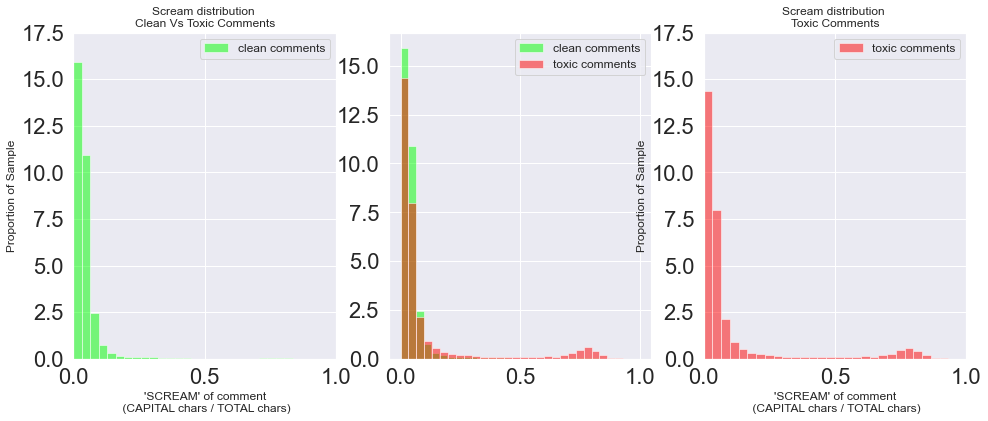

In [107]:
fig, axs = plt.subplots(1, 3, figsize=(16, 6))

_ = axs[0].hist(clean_data.loc[:, "scream_ratio"], bins=30, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[2].hist(toxic_data.loc[:, "scream_ratio"], bins=30, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

_ = axs[1].hist(clean_data.loc[:, "scream_ratio"], bins=30, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[1].hist(toxic_data.loc[:, "scream_ratio"], bins=30, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

axs[0].legend(fontsize=12)
axs[1].legend(fontsize=12)
axs[2].legend(fontsize=12)

axs[0].set_xlabel("'SCREAM' of comment\n (CAPITAL chars / TOTAL chars)", size=12)
axs[2].set_xlabel("'SCREAM' of comment\n (CAPITAL chars / TOTAL chars)", size=12)

axs[0].set_ylabel("Proportion of Sample", size=12)
axs[2].set_ylabel("Proportion of Sample", size=12)

axs[0].set_xlim(0, 1.0)
axs[2].set_xlim(0, 1.0)

axs[0].set_ylim(0, 17.5)
axs[2].set_ylim(0, 17.5)

axs[0].set_title("Scream distribution \nClean Comments", size=12)
axs[0].set_title("Scream distribution \nClean Vs Toxic Comments", size=12)
axs[2].set_title("Scream distribution \nToxic Comments", size=12)

plt.savefig("../imgs/non_log_scream.png", dpi=100, transparent=False)

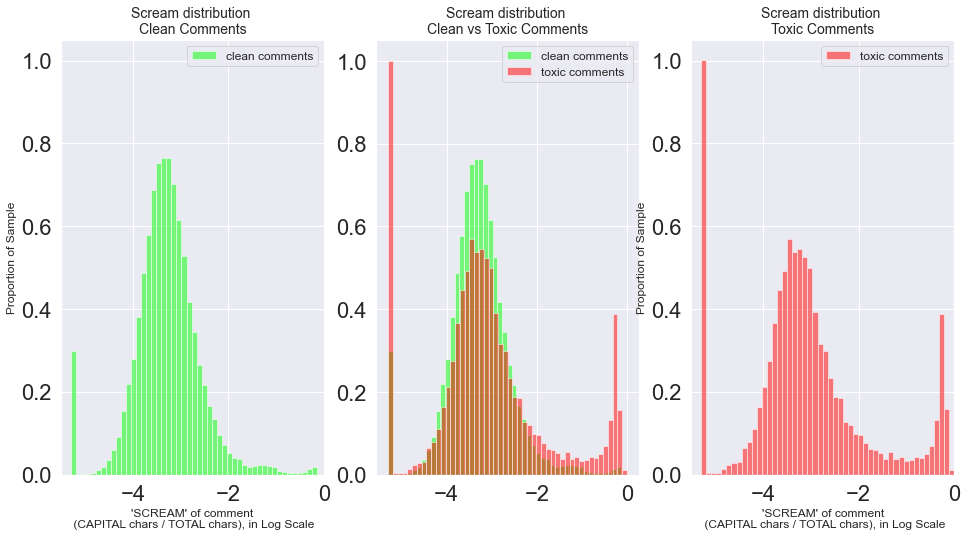

In [111]:
fig, axs = plt.subplots(1, 3, figsize=(16, 8))

_ = axs[0].hist(np.log(clean_data.loc[:, "scream_ratio"] + 0.005), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[2].hist(np.log(toxic_data.loc[:, "scream_ratio"] + 0.005), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")
_ = axs[1].hist(np.log(clean_data.loc[:, "scream_ratio"] + 0.005), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[1].hist(np.log(toxic_data.loc[:, "scream_ratio"] + 0.005), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")


axs[0].legend(fontsize=12)
axs[1].legend(fontsize=12)
axs[2].legend(fontsize=12)

axs[0].set_xlabel("'SCREAM' of comment\n (CAPITAL chars / TOTAL chars), in Log Scale", size=12)
axs[2].set_xlabel("'SCREAM' of comment\n (CAPITAL chars / TOTAL chars), in Log Scale", size=12)

axs[0].set_ylabel("Proportion of Sample", size=12)
axs[2].set_ylabel("Proportion of Sample", size=12)

axs[0].set_xlim(-5.5, 0)
axs[2].set_xlim(-5.5, 0)

axs[0].set_ylim(0, 1.05)
axs[2].set_ylim(0, 1.05)

axs[0].set_title("Scream distribution \nClean Comments", size=14)
axs[1].set_title("Scream distribution \nClean vs Toxic Comments", size=14)
axs[2].set_title("Scream distribution \nToxic Comments", size=14)

plt.savefig("../imgs/log_scream.png", dpi=100, transparent=False)

Apparently clean comemnts have more Capital letters.

### Duplicacy  
Repititive word count among comments

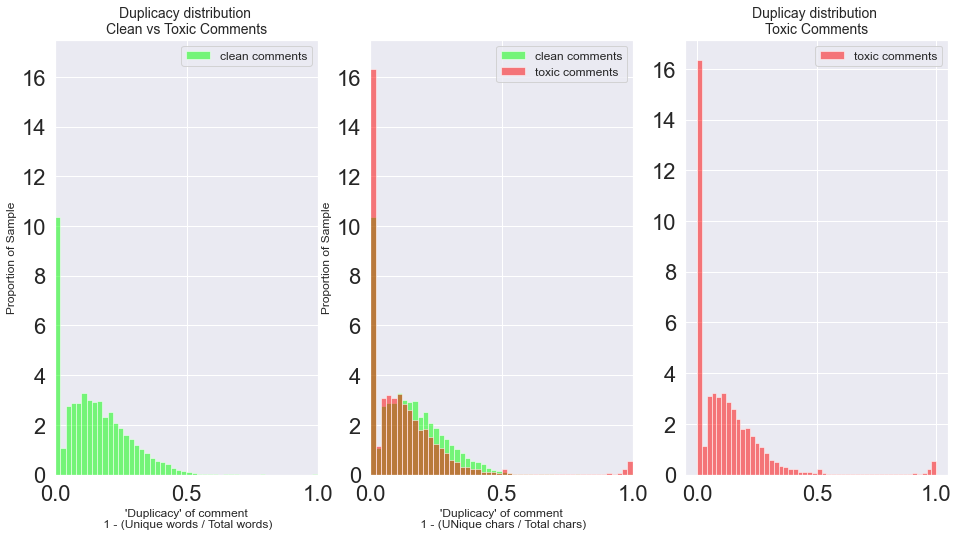

In [112]:
fig, axs = plt.subplots(1, 3, figsize=(16, 8))

_ = axs[0].hist(clean_data.loc[:, "duplicates_ratio"], bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[2].hist(toxic_data.loc[:, "duplicates_ratio"], bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")
_ = axs[1].hist(clean_data.loc[:, "duplicates_ratio"], bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[1].hist(toxic_data.loc[:, "duplicates_ratio"], bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")


axs[0].legend(fontsize=12)
axs[1].legend(fontsize=12)
axs[2].legend(fontsize=12)

axs[0].set_xlabel("'Duplicacy' of comment\n 1 - (Unique words / Total words)", size=12)
axs[1].set_xlabel("'Duplicacy' of comment\n 1 - (UNique chars / Total chars)", size=12)

axs[0].set_ylabel("Proportion of Sample", size=12)
axs[1].set_ylabel("Proportion of Sample", size=12)

axs[0].set_xlim(0, 1.0)
axs[1].set_xlim(0, 1.0)

axs[0].set_ylim(0, 17.5)
axs[1].set_ylim(0, 17.5)

axs[0].set_title("Duplicacy distribution \nClean Comments", size=14)
axs[0].set_title("Duplicacy distribution \nClean vs Toxic Comments", size=14)
axs[2].set_title("Duplicay distribution \nToxic Comments", size=14)

plt.savefig("../imgs/non_log_duplicates.png", dpi=100, transparent=False)

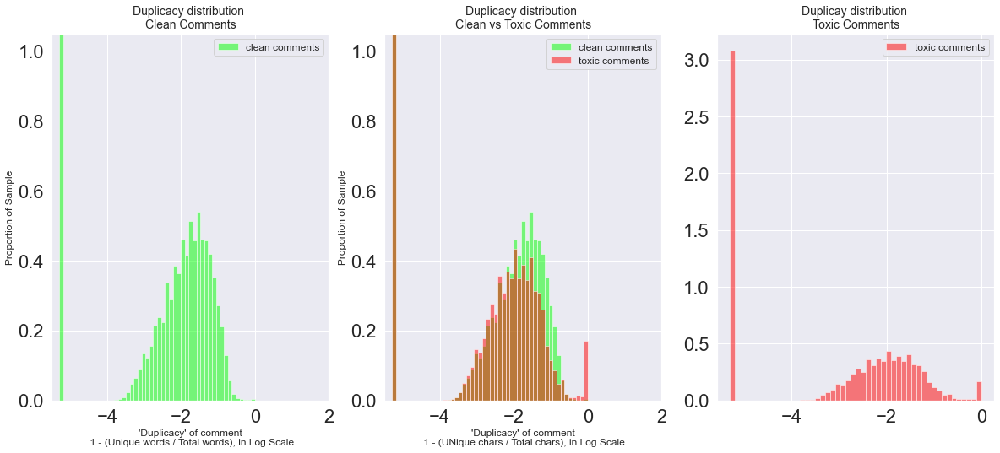

In [113]:
fig, axs = plt.subplots(1, 3, figsize=(20, 8))

_ = axs[0].hist(np.log(clean_data.loc[:, "duplicates_ratio"] + 0.005), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[2].hist(np.log(toxic_data.loc[:, "duplicates_ratio"] + 0.005), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")
_ = axs[1].hist(np.log(clean_data.loc[:, "duplicates_ratio"] + 0.005), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[1].hist(np.log(toxic_data.loc[:, "duplicates_ratio"] + 0.005), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

axs[0].legend(fontsize=12)
axs[1].legend(fontsize=12)
axs[2].legend(fontsize=12)

axs[0].set_xlabel("'Duplicacy' of comment\n 1 - (Unique words / Total words), in Log Scale", size=12)
axs[1].set_xlabel("'Duplicacy' of comment\n 1 - (UNique chars / Total chars), in Log Scale", size=12)

axs[0].set_ylabel("Proportion of Sample", size=12)
axs[1].set_ylabel("Proportion of Sample", size=12)

axs[0].set_xlim(-5.5, 2)
axs[1].set_xlim(-5.5, 2)

axs[0].set_ylim(0, 1.05)
axs[1].set_ylim(0, 1.05)

axs[0].set_title("Duplicacy distribution \nClean Comments", size=14)
axs[1].set_title("Duplicacy distribution \nClean vs Toxic Comments", size=14)
axs[2].set_title("Duplicay distribution \nToxic Comments", size=14)

plt.savefig("../imgs/log_duplicates.png", dpi=100, transparent=False)

The above historgram shows, Clean comments slightly have more duplicates. This could be due to the Spammy messages that we have seen earlier.

### Punctuations

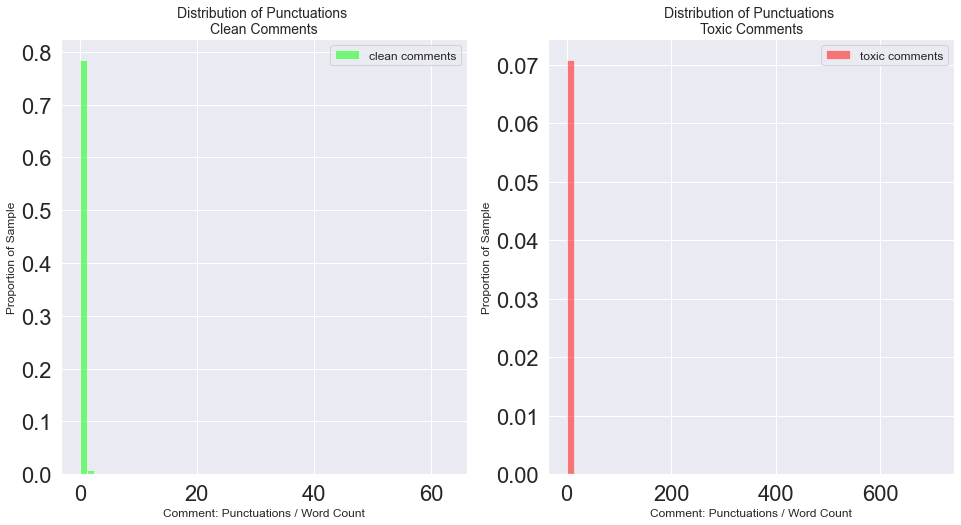

In [103]:
fig, axs = plt.subplots(1, 2, figsize=(16, 8))

_ = axs[0].hist(clean_data.loc[:, "punct_ratio"], bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[1].hist(toxic_data.loc[:, "punct_ratio"], bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

axs[0].legend(fontsize=12)
axs[1].legend(fontsize=12)

axs[0].set_xlabel("Comment: Punctuations / Word Count", size=12)
axs[1].set_xlabel("Comment: Punctuations / Word Count", size=12)

axs[0].set_ylabel("Proportion of Sample", size=12)
axs[1].set_ylabel("Proportion of Sample", size=12)

axs[0].set_title("Distribution of Punctuations \nClean Comments", size=14)
axs[1].set_title("Distribution of Punctuations \nToxic Comments", size=14)


plt.savefig("../imgs/non_log_punctuation.png", dpi=100, transparent=False)

In [104]:
clean_data["punct_ratio"].describe()

count    143346.000000
mean          0.291147
std           0.427661
min           0.000000
25%           0.150235
50%           0.218009
75%           0.327561
max          62.950000
Name: punct_ratio, dtype: float64

In [105]:
toxic_data["punct_ratio"].describe()

count    16225.000000
mean         0.391012
std          6.188616
min          0.000000
25%          0.127660
50%          0.210526
75%          0.333333
max        705.999999
Name: punct_ratio, dtype: float64

Due to extreme differences in Min - Max and Mean in the punctuation ratio, its better to visualize in log scale rather than normal scale

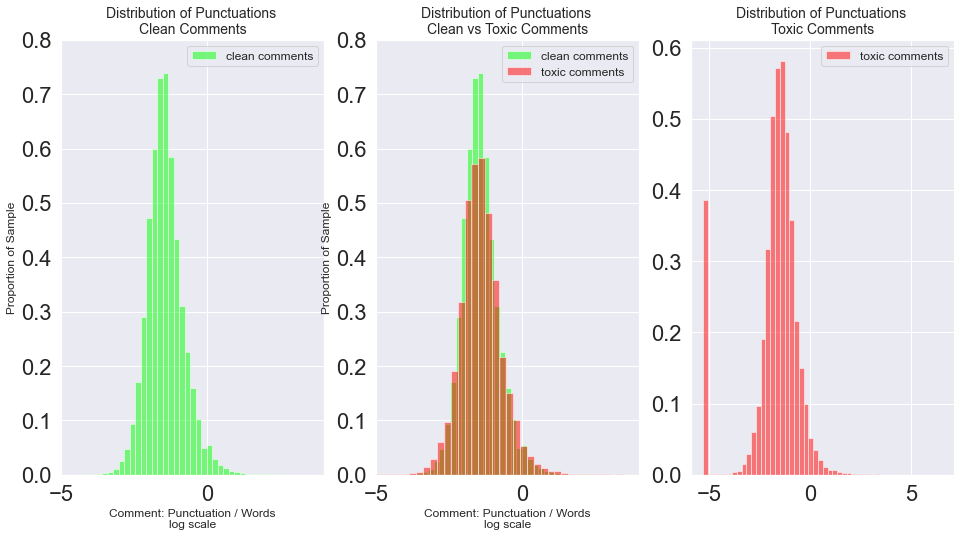

In [115]:
fig, axs = plt.subplots(1, 3, figsize=(16, 8))

_ = axs[0].hist(np.log(clean_data.loc[:, "punct_ratio"] + 0.005), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[2].hist(np.log(toxic_data.loc[:, "punct_ratio"] + 0.005), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")
_ = axs[1].hist(np.log(clean_data.loc[:, "punct_ratio"] + 0.005), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[1].hist(np.log(toxic_data.loc[:, "punct_ratio"] + 0.005), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

axs[0].legend(fontsize=12)
axs[1].legend(fontsize=12)
axs[2].legend(fontsize=12)

axs[0].set_xlabel("Comment: Punctuation / Words\nlog scale", size=12)
axs[1].set_xlabel("Comment: Punctuation / Words\nlog scale", size=12)

axs[0].set_ylabel("Proportion of Sample", size=12)
axs[1].set_ylabel("Proportion of Sample", size=12)

axs[0].set_xlim(-5, 4.0)
axs[1].set_xlim(-5, 4.0)

axs[0].set_title("Distribution of Punctuations \nClean Comments", size=14)
axs[1].set_title("Distribution of Punctuations \nClean vs Toxic Comments", size=14)
axs[2].set_title("Distribution of Punctuations \nToxic Comments", size=14)

axs[0].set_ylim(0, 0.80)
axs[1].set_ylim(0, 0.80)

plt.savefig("../imgs/log_punctuation.png", dpi=100, transparent=False)

Not much difference between either plots.

### Question marks


In [107]:
clean_data["question_ratio"].describe()

count    143346.000000
mean          0.011904
std           0.055876
min           0.000000
25%           0.000000
50%           0.000000
75%           0.002581
max           8.000000
Name: question_ratio, dtype: float64

In [108]:
toxic_data["question_ratio"].describe()

count    16225.000000
mean         0.016879
std          0.097059
min          0.000000
25%          0.000000
50%          0.000000
75%          0.004098
max          6.147059
Name: question_ratio, dtype: float64

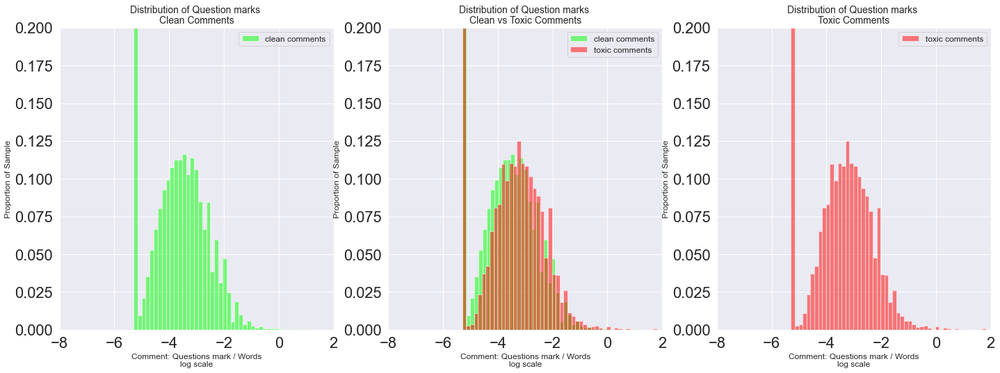

In [109]:
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

_ = axs[0].hist(np.log(clean_data.loc[:, "question_ratio"] + 0.005), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[2].hist(np.log(toxic_data.loc[:, "question_ratio"] + 0.005), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

_ = axs[1].hist(np.log(clean_data.loc[:, "question_ratio"] + 0.005), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[1].hist(np.log(toxic_data.loc[:, "question_ratio"] + 0.005), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

axs[0].legend(fontsize=12)
axs[1].legend(fontsize=12)
axs[2].legend(fontsize=12)

axs[0].set_xlabel("Comment: Questions mark / Words\nlog scale", size=12)
axs[1].set_xlabel("Comment: Questions mark / Words\nlog scale", size=12)
axs[2].set_xlabel("Comment: Questions mark / Words\nlog scale", size=12)

axs[0].set_ylabel("Proportion of Sample", size=12)
axs[1].set_ylabel("Proportion of Sample", size=12)
axs[2].set_ylabel("Proportion of Sample", size=12)

axs[0].set_xlim(-8, 2.0)
axs[1].set_xlim(-8, 2.0)
axs[2].set_xlim(-8, 2.0)

axs[0].set_title("Distribution of Question marks \nClean Comments", size=14)
axs[1].set_title("Distribution of Question marks \nClean vs Toxic Comments", size=14)
axs[2].set_title("Distribution of Question marks \nToxic Comments", size=14)

axs[0].set_ylim(0, 0.20)
axs[1].set_ylim(0, 0.20)
axs[2].set_ylim(0, 0.20)

plt.savefig("../imgs/log_question_mark.png", dpi=100, transparent=False)

Slightly more question mark usage in toxic comments.

### Exclamation marks

In [110]:
clean_data["exclamation_ratio"].describe()

count    143346.000000
mean          0.010881
std           0.267480
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          62.650000
Name: exclamation_ratio, dtype: float64

In [111]:
toxic_data["exclamation_ratio"].describe()

count    16225.000000
mean         0.128034
std          5.770145
min          0.000000
25%          0.000000
50%          0.000000
75%          0.009709
max        705.999999
Name: exclamation_ratio, dtype: float64

Extreme difference between Mean-Min-Max, lets try to visualize in log scale.
Also note **min** here is **zero**. So there are comments with no exclamations

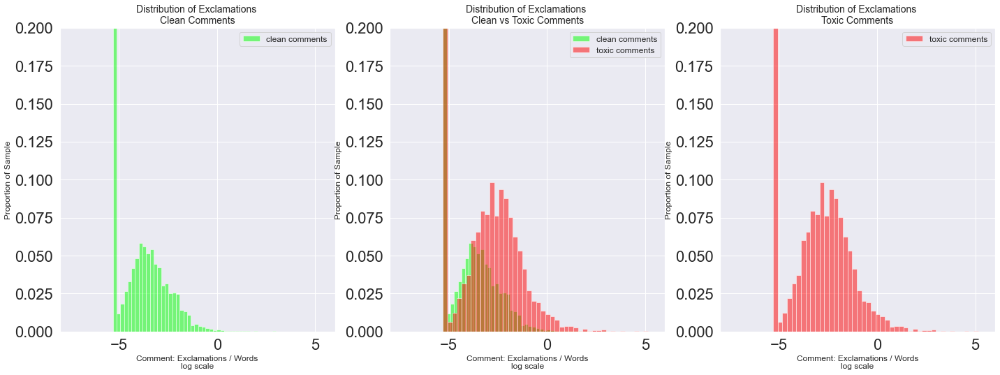

In [112]:
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

_ = axs[0].hist(np.log(clean_data.loc[:, "exclamation_ratio"] + 0.005), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[2].hist(np.log(toxic_data.loc[:, "exclamation_ratio"] + 0.005), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

_ = axs[1].hist(np.log(clean_data.loc[:, "exclamation_ratio"] + 0.005), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[1].hist(np.log(toxic_data.loc[:, "exclamation_ratio"] + 0.005), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

axs[0].legend(fontsize=12)
axs[1].legend(fontsize=12)
axs[2].legend(fontsize=12)

axs[0].set_xlabel("Comment: Exclamations / Words\nlog scale", size=12)
axs[1].set_xlabel("Comment: Exclamations / Words\nlog scale", size=12)
axs[2].set_xlabel("Comment: Exclamations / Words\nlog scale", size=12)

axs[0].set_ylabel("Proportion of Sample", size=12)
axs[1].set_ylabel("Proportion of Sample", size=12)
axs[2].set_ylabel("Proportion of Sample", size=12)

axs[0].set_xlim(-8, 6.0)
axs[1].set_xlim(-8, 6.0)
axs[2].set_xlim(-8, 6.0)

axs[0].set_title("Distribution of Exclamations \nClean Comments", size=14)
axs[1].set_title("Distribution of Exclamations \nClean vs Toxic Comments", size=14)
axs[2].set_title("Distribution of Exclamations \nToxic Comments", size=14)

axs[0].set_ylim(0, 0.20)
axs[1].set_ylim(0, 0.20)
axs[2].set_ylim(0, 0.20)

plt.savefig("../imgs/log_exclamation.png", dpi=100, transparent=False)

High usage of exclamations in toxic comments.

### Period Ratio

In [113]:
clean_data["period_ratio"].describe()

count    143346.000000
mean          0.082002
std           0.131170
min           0.000000
25%           0.037037
50%           0.060000
75%           0.093750
max          24.714286
Name: period_ratio, dtype: float64

In [114]:
toxic_data["period_ratio"].describe()

count    16225.000000
mean         0.097630
std          0.313329
min          0.000000
25%          0.000000
50%          0.061674
75%          0.117647
max         32.333333
Name: period_ratio, dtype: float64

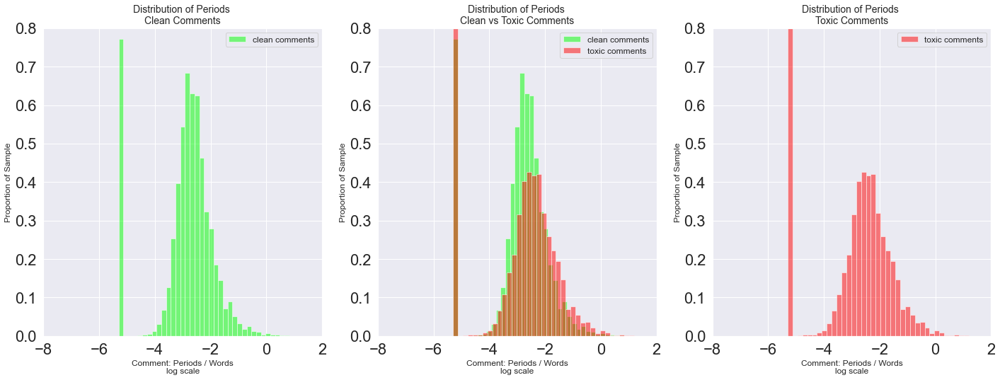

In [115]:
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

_ = axs[0].hist(np.log(clean_data.loc[:, "period_ratio"] + 0.005), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[2].hist(np.log(toxic_data.loc[:, "period_ratio"] + 0.005), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

_ = axs[1].hist(np.log(clean_data.loc[:, "period_ratio"] + 0.005), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[1].hist(np.log(toxic_data.loc[:, "period_ratio"] + 0.005), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

axs[0].legend(fontsize=12)
axs[1].legend(fontsize=12)
axs[2].legend(fontsize=12)

axs[0].set_xlabel("Comment: Periods / Words\nlog scale", size=12)
axs[1].set_xlabel("Comment: Periods / Words\nlog scale", size=12)
axs[2].set_xlabel("Comment: Periods / Words\nlog scale", size=12)

axs[0].set_ylabel("Proportion of Sample", size=12)
axs[1].set_ylabel("Proportion of Sample", size=12)
axs[2].set_ylabel("Proportion of Sample", size=12)

axs[0].set_xlim(-8, 2.0)
axs[1].set_xlim(-8, 2.0)
axs[2].set_xlim(-8, 2.0)

axs[0].set_title("Distribution of Periods \nClean Comments", size=14)
axs[1].set_title("Distribution of Periods \nClean vs Toxic Comments", size=14)
axs[2].set_title("Distribution of Periods \nToxic Comments", size=14)

axs[0].set_ylim(0, 0.80)
axs[1].set_ylim(0, 0.80)
axs[2].set_ylim(0, 0.80)

plt.savefig("../imgs/log_period.png", dpi=100, transparent=False)

Not much differences.

### Smiley :) :) :)

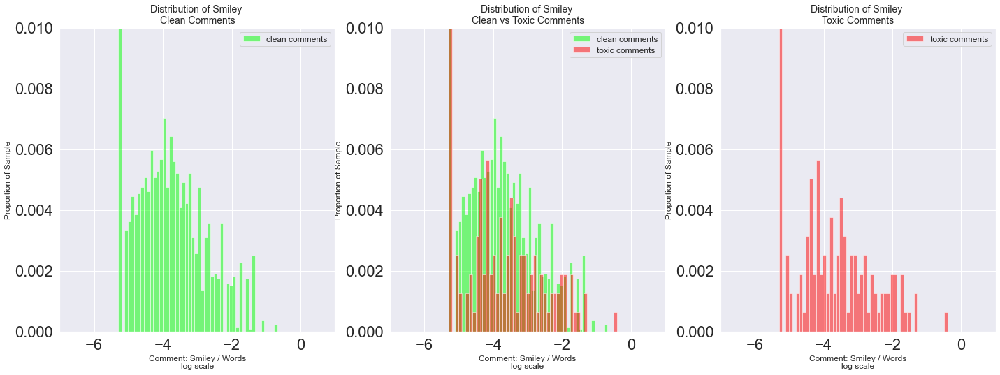

In [116]:
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

_ = axs[0].hist(np.log(clean_data.loc[:, "smiley_ratio"] + 0.005), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[2].hist(np.log(toxic_data.loc[:, "smiley_ratio"] + 0.005), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

_ = axs[1].hist(np.log(clean_data.loc[:, "smiley_ratio"] + 0.005), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[1].hist(np.log(toxic_data.loc[:, "smiley_ratio"] + 0.005), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

axs[0].legend(fontsize=12)
axs[1].legend(fontsize=12)
axs[2].legend(fontsize=12)

axs[0].set_xlabel("Comment: Smiley / Words\nlog scale", size=12)
axs[1].set_xlabel("Comment: Smiley / Words\nlog scale", size=12)
axs[2].set_xlabel("Comment: Smiley / Words\nlog scale", size=12)

axs[0].set_ylabel("Proportion of Sample", size=12)
axs[1].set_ylabel("Proportion of Sample", size=12)
axs[2].set_ylabel("Proportion of Sample", size=12)

axs[0].set_xlim(-7, 1.0)
axs[1].set_xlim(-7, 1.0)
axs[2].set_xlim(-7, 1.0)

axs[0].set_title("Distribution of Smiley \nClean Comments", size=14)
axs[1].set_title("Distribution of Smiley \nClean vs Toxic Comments", size=14)
axs[2].set_title("Distribution of Smiley \nToxic Comments", size=14)

axs[0].set_ylim(0, 0.01)
axs[1].set_ylim(0, 0.01)
axs[2].set_ylim(0, 0.01)

plt.savefig("../imgs/log_smiley.png", dpi=100, transparent=False)

It is evident that proportion of Happy smiley is more in the clean comments.

### Sadness

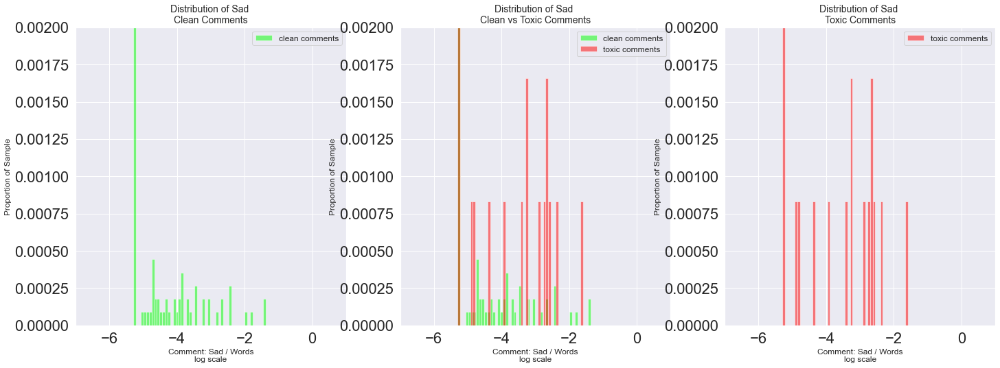

In [117]:
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

_ = axs[0].hist(np.log(clean_data.loc[:, "sad_ratio"] + 0.005), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[2].hist(np.log(toxic_data.loc[:, "sad_ratio"] + 0.005), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

_ = axs[1].hist(np.log(clean_data.loc[:, "sad_ratio"] + 0.005), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[1].hist(np.log(toxic_data.loc[:, "sad_ratio"] + 0.005), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

axs[0].legend(fontsize=12)
axs[1].legend(fontsize=12)
axs[2].legend(fontsize=12)

axs[0].set_xlabel("Comment: Sad / Words\nlog scale", size=12)
axs[1].set_xlabel("Comment: Sad / Words\nlog scale", size=12)
axs[2].set_xlabel("Comment: Sad / Words\nlog scale", size=12)

axs[0].set_ylabel("Proportion of Sample", size=12)
axs[1].set_ylabel("Proportion of Sample", size=12)
axs[2].set_ylabel("Proportion of Sample", size=12)

axs[0].set_xlim(-7, 1.0)
axs[1].set_xlim(-7, 1.0)
axs[2].set_xlim(-7, 1.0)

axs[0].set_title("Distribution of Sad \nClean Comments", size=14)
axs[1].set_title("Distribution of Sad \nClean vs Toxic Comments", size=14)
axs[2].set_title("Distribution of Sad \nToxic Comments", size=14)

axs[0].set_ylim(0, 0.002)
axs[1].set_ylim(0, 0.002)
axs[2].set_ylim(0, 0.002)

plt.savefig("../imgs/log_sad.png", dpi=100, transparent=False)

It is clearly evident that proportion of sad emoticons is higher in toxic comments

### Word Count

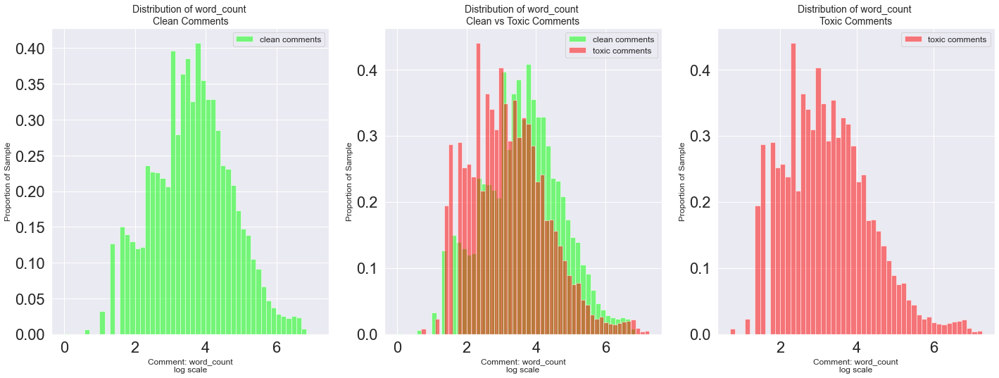

In [118]:
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

_ = axs[0].hist(np.log(clean_data.loc[:, "word_count"]), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[2].hist(np.log(toxic_data.loc[:, "word_count"]), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

_ = axs[1].hist(np.log(clean_data.loc[:, "word_count"]), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[1].hist(np.log(toxic_data.loc[:, "word_count"]), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

axs[0].legend(fontsize=12)
axs[1].legend(fontsize=12)
axs[2].legend(fontsize=12)

axs[0].set_xlabel("Comment: word_count\nlog scale", size=12)
axs[1].set_xlabel("Comment: word_count\nlog scale", size=12)
axs[2].set_xlabel("Comment: word_count\nlog scale", size=12)

axs[0].set_ylabel("Proportion of Sample", size=12)
axs[1].set_ylabel("Proportion of Sample", size=12)
axs[2].set_ylabel("Proportion of Sample", size=12)


axs[0].set_title("Distribution of word_count \nClean Comments", size=14)
axs[1].set_title("Distribution of word_count \nClean vs Toxic Comments", size=14)
axs[2].set_title("Distribution of word_count \nToxic Comments", size=14)


plt.savefig("../imgs/log_word_count.png", dpi=100, transparent=False)

Clean comments tend to have slightly greater word count.

### IP Addresses

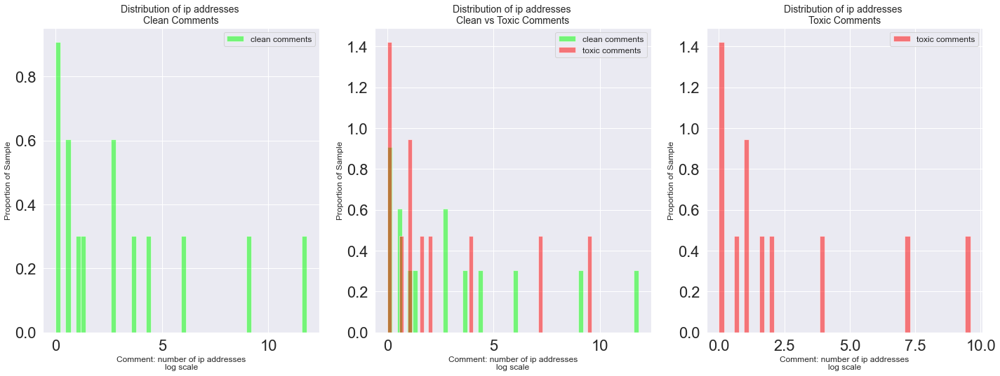

In [119]:
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

_ = axs[0].hist(np.log(clean_data.ip_addresses.apply(lambda row: len(row)).value_counts()), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[2].hist(np.log(toxic_data.ip_addresses.apply(lambda row: len(row)).value_counts()), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

_ = axs[1].hist(np.log(clean_data.ip_addresses.apply(lambda row: len(row)).value_counts()), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[1].hist(np.log(toxic_data.ip_addresses.apply(lambda row: len(row)).value_counts()), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

axs[0].legend(fontsize=12)
axs[1].legend(fontsize=12)
axs[2].legend(fontsize=12)

axs[0].set_xlabel("Comment: number of ip addresses\nlog scale", size=12)
axs[1].set_xlabel("Comment: number of ip addresses\nlog scale", size=12)
axs[2].set_xlabel("Comment: number of ip addresses\nlog scale", size=12)

axs[0].set_ylabel("Proportion of Sample", size=12)
axs[1].set_ylabel("Proportion of Sample", size=12)
axs[2].set_ylabel("Proportion of Sample", size=12)


axs[0].set_title("Distribution of ip addresses \nClean Comments", size=14)
axs[1].set_title("Distribution of ip addresses \nClean vs Toxic Comments", size=14)
axs[2].set_title("Distribution of ip addresses \nToxic Comments", size=14)


plt.savefig("../imgs/log_ip_addresses.png", dpi=100, transparent=False)

Hard to grasp the differences.

### Urls

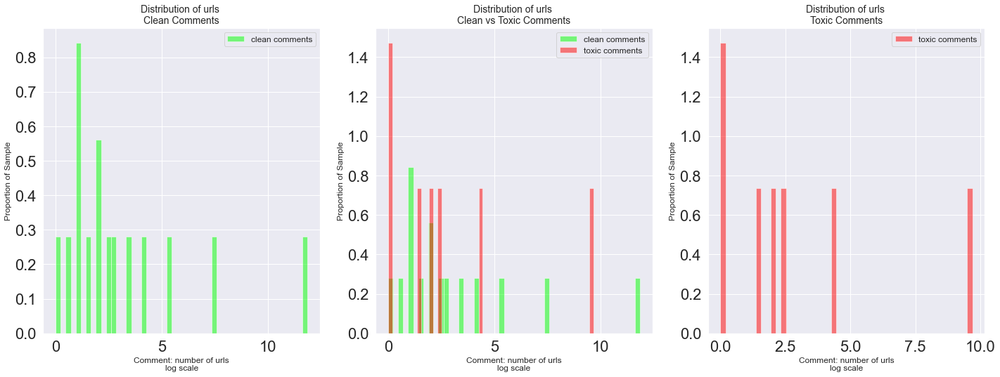

In [120]:
fig, axs = plt.subplots(1, 3, figsize=(24, 8))

_ = axs[0].hist(np.log(clean_data.url_count.value_counts()), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[2].hist(np.log(toxic_data.url_count.value_counts()), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

_ = axs[1].hist(np.log(clean_data.url_count.value_counts()), bins=50, density=True, color=GOOD_COLOR, alpha=0.5, label="clean comments")
_ = axs[1].hist(np.log(toxic_data.url_count.value_counts()), bins=50, density=True, color=BAD_COLOR, alpha=0.5, label="toxic comments")

axs[0].legend(fontsize=12)
axs[1].legend(fontsize=12)
axs[2].legend(fontsize=12)

axs[0].set_xlabel("Comment: number of urls\nlog scale", size=12)
axs[1].set_xlabel("Comment: number of urls\nlog scale", size=12)
axs[2].set_xlabel("Comment: number of urls\nlog scale", size=12)

axs[0].set_ylabel("Proportion of Sample", size=12)
axs[1].set_ylabel("Proportion of Sample", size=12)
axs[2].set_ylabel("Proportion of Sample", size=12)


axs[0].set_title("Distribution of urls \nClean Comments", size=14)
axs[1].set_title("Distribution of urls \nClean vs Toxic Comments", size=14)
axs[2].set_title("Distribution of urls \nToxic Comments", size=14)


plt.savefig("../imgs/log_urls.png", dpi=100, transparent=False)

Same as ips, hard to grasp but toxic comments seems to contain more URLs

### Dimensionality Reduction and Visualization

In [119]:
train_df.columns

Index(['id', 'comment_text', 'toxic', 'severe_toxic', 'obscene', 'threat',
       'insult', 'identity_hate', 'clean'],
      dtype='object')

In [44]:
text = train_df.comment_text

In [45]:
# n-grams = 1,1
word_vect_1gram = TfidfVectorizer(
    sublinear_tf = True,
    strip_accents = "unicode",
    analyzer = "word",
    token_pattern = r"\w{1,}",
    stop_words = "english",
    ngram_range = (1,1),
    max_features = 5000
)

In [46]:
word_vect_1gram.fit(text)

TfidfVectorizer(max_features=5000, stop_words='english',
                strip_accents='unicode', sublinear_tf=True,
                token_pattern='\\w{1,}')

In [47]:
train_featres = word_vect_1gram.transform(text)
print(f"Train features shape: {train_featres.shape}")

Train features shape: (159571, 5000)


In [48]:
labels = train_df.iloc[:,2:-1]
print(labels.shape)

(159571, 6)


In [49]:
toxic_text = train_df.loc[train_df.clean==False].iloc[:,:-1]
toxic_text.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16225 entries, 6 to 159554
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   id             16225 non-null  object
 1   comment_text   16225 non-null  object
 2   toxic          16225 non-null  int64 
 3   severe_toxic   16225 non-null  int64 
 4   obscene        16225 non-null  int64 
 5   threat         16225 non-null  int64 
 6   insult         16225 non-null  int64 
 7   identity_hate  16225 non-null  int64 
dtypes: int64(6), object(2)
memory usage: 1.1+ MB


In [50]:
toxic_word_vectors = word_vect_1gram.transform(toxic_text.comment_text)

In [51]:
toxic_word_vectors

<16225x5000 sparse matrix of type '<class 'numpy.float64'>'
	with 232259 stored elements in Compressed Sparse Row format>

In [52]:
pca_dense = toxic_word_vectors.todense()
pca = PCA(n_components = 15)
pca_output = pca.fit_transform(pca_dense)

No handles with labels found to put in legend.


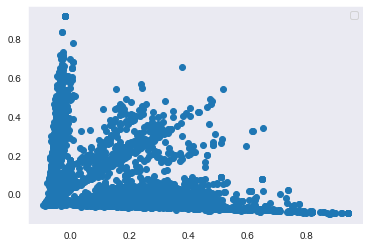

In [58]:
plot = plt.scatter(pca_output[:,0], pca_output[:,1])
plt.legend(handles=plot.legend_elements()[0], labels=COLUMNS)
plt.show()

In [59]:
print(pca_output.shape)

(16225, 15)


In [60]:
tsne = TSNE(n_components=2, verbose=1, perplexity=30, n_iter=400)
tsne_results = tsne.fit_transform(pca_output)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 16225 samples in 0.095s...
[t-SNE] Computed neighbors for 16225 samples in 5.985s...
[t-SNE] Computed conditional probabilities for sample 1000 / 16225
[t-SNE] Computed conditional probabilities for sample 2000 / 16225
[t-SNE] Computed conditional probabilities for sample 3000 / 16225
[t-SNE] Computed conditional probabilities for sample 4000 / 16225
[t-SNE] Computed conditional probabilities for sample 5000 / 16225
[t-SNE] Computed conditional probabilities for sample 6000 / 16225
[t-SNE] Computed conditional probabilities for sample 7000 / 16225
[t-SNE] Computed conditional probabilities for sample 8000 / 16225
[t-SNE] Computed conditional probabilities for sample 9000 / 16225
[t-SNE] Computed conditional probabilities for sample 10000 / 16225
[t-SNE] Computed conditional probabilities for sample 11000 / 16225
[t-SNE] Computed conditional probabilities for sample 12000 / 16225
[t-SNE] Computed conditional probabilities for sam

In [61]:
x_dim = tsne_results[:, 0]
y_dim = tsne_results[:, 1]

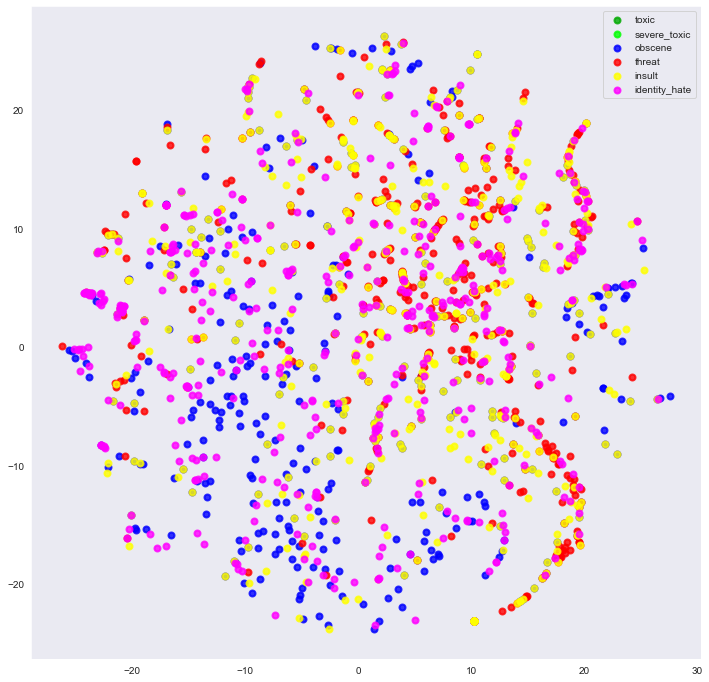

In [62]:
fig, ax = plt.subplots(figsize=(12,12))

colors = ["#00AA00", "#00FF00", "#0000FF", "#FF0000", "#FFFF00", "#FF00FF"]
class_names = ["toxic", "severe_toxic", "obscene", "threat", "insult", "identity_hate"]

for i in range(len(class_names)):
    indicies = np.arange(0, toxic_text.shape[0])
    ax.scatter(
        x_dim[toxic_text.iloc[:, i]==1][:500],
        y_dim[toxic_text.iloc[:, i]==1][:500],
        lw =2,
        edgecolor = colors[i],
        color=colors[i],
        label=class_names[i],
        alpha=0.8
    )
    
ax.legend()

### Cleaning

1. Removal of HTML tags
2. Replacing punctuation marks
3. Removal of newline feeds
4. Converting to lowercase
5. Removal of stop words
6. Replace aphostephe words with expansions
7. Removal of emojis
8. Removal of usernames
9. Removal of ip addresses
10. lemmatize text - Lemmatization is preferred over stemming because lemmatization converts words to their meaningful base form

In [63]:
punct_tok = re.compile(f'([{string.punctuation}“”¨«»®´·º½¾¿¡§£₤‘’])')
def tokenize(comment):
    return punct_tok.sub(r' \1 ', comment).split()

In [64]:
EMOJIS = {
    u":‑\)":"Happy face or smiley",
    u":\)":"Happy face or smiley",
    u":-\]":"Happy face or smiley",
    u":\]":"Happy face or smiley",
    u":-3":"Happy face smiley",
    u":3":"Happy face smiley",
    u":->":"Happy face smiley",
    u":>":"Happy face smiley",
    u"8-\)":"Happy face smiley",
    u":o\)":"Happy face smiley",
    u":-\}":"Happy face smiley",
    u":\}":"Happy face smiley",
    u":-\)":"Happy face smiley",
    u":c\)":"Happy face smiley",
    u":\^\)":"Happy face smiley",
    u"=\]":"Happy face smiley",
    u"=\)":"Happy face smiley",
    u":‑D":"Laughing, big grin or laugh with glasses",
    u":D":"Laughing, big grin or laugh with glasses",
    u"8‑D":"Laughing, big grin or laugh with glasses",
    u"8D":"Laughing, big grin or laugh with glasses",
    u"X‑D":"Laughing, big grin or laugh with glasses",
    u"XD":"Laughing, big grin or laugh with glasses",
    u"=D":"Laughing, big grin or laugh with glasses",
    u"=3":"Laughing, big grin or laugh with glasses",
    u"B\^D":"Laughing, big grin or laugh with glasses",
    u":-\)\)":"Very happy",
    u":‑\(":"Frown, sad, andry or pouting",
    u":-\(":"Frown, sad, andry or pouting",
    u":\(":"Frown, sad, andry or pouting",
    u":‑c":"Frown, sad, andry or pouting",
    u":c":"Frown, sad, andry or pouting",
    u":‑<":"Frown, sad, andry or pouting",
    u":<":"Frown, sad, andry or pouting",
    u":‑\[":"Frown, sad, andry or pouting",
    u":\[":"Frown, sad, andry or pouting",
    u":-\|\|":"Frown, sad, andry or pouting",
    u">:\[":"Frown, sad, andry or pouting",
    u":\{":"Frown, sad, andry or pouting",
    u":@":"Frown, sad, andry or pouting",
    u">:\(":"Frown, sad, andry or pouting",
    u":'‑\(":"Crying",
    u":'\(":"Crying",
    u":'‑\)":"Tears of happiness",
    u":'\)":"Tears of happiness",
    u"D‑':":"Horror",
    u"D:<":"Disgust",
    u"D:":"Sadness",
    u"D8":"Great dismay",
    u"D;":"Great dismay",
    u"D=":"Great dismay",
    u"DX":"Great dismay",
    u":‑O":"Surprise",
    u":O":"Surprise",
    u":‑o":"Surprise",
    u":o":"Surprise",
    u":-0":"Shock",
    u"8‑0":"Yawn",
    u">:O":"Yawn",
    u":-\*":"Kiss",
    u":\*":"Kiss",
    u":X":"Kiss",
    u";‑\)":"Wink or smirk",
    u";\)":"Wink or smirk",
    u"\*-\)":"Wink or smirk",
    u"\*\)":"Wink or smirk",
    u";‑\]":"Wink or smirk",
    u";\]":"Wink or smirk",
    u";\^\)":"Wink or smirk",
    u":‑,":"Wink or smirk",
    u";D":"Wink or smirk",
    u":‑P":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u":P":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u"X‑P":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u"XP":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u":‑Þ":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u":Þ":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u":b":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u"d:":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u"=p":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u">:P":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u":‑/":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u":/":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u":-[.]":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u">:[(\\\)]":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u">:/":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u":[(\\\)]":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u"=/":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u"=[(\\\)]":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u":L":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u"=L":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u":S":"Skeptical, annoyed, undecided, uneasy or hesitant",
    u":‑\|":"Straight face",
    u":\|":"Straight face",
    u":$":"Embarrassed or blushing",
    u":‑x":"Sealed lips or wearing braces or tongue-tied",
    u":x":"Sealed lips or wearing braces or tongue-tied",
    u":‑#":"Sealed lips or wearing braces or tongue-tied",
    u":#":"Sealed lips or wearing braces or tongue-tied",
    u":‑&":"Sealed lips or wearing braces or tongue-tied",
    u":&":"Sealed lips or wearing braces or tongue-tied",
    u"O:‑\)":"Angel, saint or innocent",
    u"O:\)":"Angel, saint or innocent",
    u"0:‑3":"Angel, saint or innocent",
    u"0:3":"Angel, saint or innocent",
    u"0:‑\)":"Angel, saint or innocent",
    u"0:\)":"Angel, saint or innocent",
    u":‑b":"Tongue sticking out, cheeky, playful or blowing a raspberry",
    u"0;\^\)":"Angel, saint or innocent",
    u">:‑\)":"Evil or devilish",
    u">:\)":"Evil or devilish",
    u"\}:‑\)":"Evil or devilish",
    u"\}:\)":"Evil or devilish",
    u"3:‑\)":"Evil or devilish",
    u"3:\)":"Evil or devilish",
    u">;\)":"Evil or devilish",
    u"\|;‑\)":"Cool",
    u"\|‑O":"Bored",
    u":‑J":"Tongue-in-cheek",
    u"#‑\)":"Party all night",
    u"%‑\)":"Drunk or confused",
    u"%\)":"Drunk or confused",
    u":-###..":"Being sick",
    u":###..":"Being sick",
    u"<:‑\|":"Dump",
    u"\(>_<\)":"Troubled",
    u"\(>_<\)>":"Troubled",
    u"\(';'\)":"Baby",
    u"\(\^\^>``":"Nervous or Embarrassed or Troubled or Shy or Sweat drop",
    u"\(\^_\^;\)":"Nervous or Embarrassed or Troubled or Shy or Sweat drop",
    u"\(-_-;\)":"Nervous or Embarrassed or Troubled or Shy or Sweat drop",
    u"\(~_~;\) \(・\.・;\)":"Nervous or Embarrassed or Troubled or Shy or Sweat drop",
    u"\(-_-\)zzz":"Sleeping",
    u"\(\^_-\)":"Wink",
    u"\(\(\+_\+\)\)":"Confused",
    u"\(\+o\+\)":"Confused",
    u"\(o\|o\)":"Ultraman",
    u"\^_\^":"Joyful",
    u"\(\^_\^\)/":"Joyful",
    u"\(\^O\^\)／":"Joyful",
    u"\(\^o\^\)／":"Joyful",
    u"\(__\)":"Kowtow as a sign of respect, or dogeza for apology",
    u"_\(\._\.\)_":"Kowtow as a sign of respect, or dogeza for apology",
    u"<\(_ _\)>":"Kowtow as a sign of respect, or dogeza for apology",
    u"<m\(__\)m>":"Kowtow as a sign of respect, or dogeza for apology",
    u"m\(__\)m":"Kowtow as a sign of respect, or dogeza for apology",
    u"m\(_ _\)m":"Kowtow as a sign of respect, or dogeza for apology",
    u"\('_'\)":"Sad or Crying",
    u"\(/_;\)":"Sad or Crying",
    u"\(T_T\) \(;_;\)":"Sad or Crying",
    u"\(;_;":"Sad of Crying",
    u"\(;_:\)":"Sad or Crying",
    u"\(;O;\)":"Sad or Crying",
    u"\(:_;\)":"Sad or Crying",
    u"\(ToT\)":"Sad or Crying",
    u";_;":"Sad or Crying",
    u";-;":"Sad or Crying",
    u";n;":"Sad or Crying",
    u";;":"Sad or Crying",
    u"Q\.Q":"Sad or Crying",
    u"T\.T":"Sad or Crying",
    u"QQ":"Sad or Crying",
    u"Q_Q":"Sad or Crying",
    u"\(-\.-\)":"Shame",
    u"\(-_-\)":"Shame",
    u"\(一一\)":"Shame",
    u"\(；一_一\)":"Shame",
    u"\(=_=\)":"Tired",
    u"\(=\^\·\^=\)":"cat",
    u"\(=\^\·\·\^=\)":"cat",
    u"=_\^=	":"cat",
    u"\(\.\.\)":"Looking down",
    u"\(\._\.\)":"Looking down",
    u"\^m\^":"Giggling with hand covering mouth",
    u"\(\・\・?":"Confusion",
    u"\(?_?\)":"Confusion",
    u">\^_\^<":"Normal Laugh",
    u"<\^!\^>":"Normal Laugh",
    u"\^/\^":"Normal Laugh",
    u"\（\*\^_\^\*）" :"Normal Laugh",
    u"\(\^<\^\) \(\^\.\^\)":"Normal Laugh",
    u"\(^\^\)":"Normal Laugh",
    u"\(\^\.\^\)":"Normal Laugh",
    u"\(\^_\^\.\)":"Normal Laugh",
    u"\(\^_\^\)":"Normal Laugh",
    u"\(\^\^\)":"Normal Laugh",
    u"\(\^J\^\)":"Normal Laugh",
    u"\(\*\^\.\^\*\)":"Normal Laugh",
    u"\(\^—\^\）":"Normal Laugh",
    u"\(#\^\.\^#\)":"Normal Laugh",
    u"\（\^—\^\）":"Waving",
    u"\(;_;\)/~~~":"Waving",
    u"\(\^\.\^\)/~~~":"Waving",
    u"\(-_-\)/~~~ \($\·\·\)/~~~":"Waving",
    u"\(T_T\)/~~~":"Waving",
    u"\(ToT\)/~~~":"Waving",
    u"\(\*\^0\^\*\)":"Excited",
    u"\(\*_\*\)":"Amazed",
    u"\(\*_\*;":"Amazed",
    u"\(\+_\+\) \(@_@\)":"Amazed",
    u"\(\*\^\^\)v":"Laughing,Cheerful",
    u"\(\^_\^\)v":"Laughing,Cheerful",
    u"\(\(d[-_-]b\)\)":"Headphones,Listening to music",
    u'\(-"-\)':"Worried",
    u"\(ーー;\)":"Worried",
    u"\(\^0_0\^\)":"Eyeglasses",
    u"\(\＾ｖ\＾\)":"Happy",
    u"\(\＾ｕ\＾\)":"Happy",
    u"\(\^\)o\(\^\)":"Happy",
    u"\(\^O\^\)":"Happy",
    u"\(\^o\^\)":"Happy",
    u"\)\^o\^\(":"Happy",
    u":O o_O":"Surprised",
    u"o_0":"Surprised",
    u"o\.O":"Surpised",
    u"\(o\.o\)":"Surprised",
    u"oO":"Surprised",
    u"\(\*￣m￣\)":"Dissatisfied",
    u"\(‘A`\)":"Snubbed or Deflated"
}

In [65]:
repl = {
    "yay!": " good ",
    "yay": " good ",
    "yaay": " good ",
    "yaaay": " good ",
    "yaaaay": " good ",
    "yaaaaay": " good ",
    r"\br\b": "are",
    r"\bu\b": "you",
    r"\bhaha\b": "ha",
    r"\bhahaha\b": "ha",
    r"\bdon't\b": "do not",
    r"\bdoesn't\b": "does not",
    r"\bdidn't\b": "did not",
    r"\bhasn't\b": "has not",
    r"\bhaven't\b": "have not",
    r"\bhadn't\b": "had not",
    r"\bwon't\b": "will not",
    r"\bwouldn't\b": "would not",
    r"\bcan't\b": "can not",
    r"\bcannot\b": "can not",
    r"\bi'm\b": "i am",
    "m": "am",
    "r": "are",
    "u": "you",
    "haha": "ha",
    "hahaha": "ha",
    "don't": "do not",
    "doesn't": "does not",
    "didn't": "did not",
    "hasn't": "has not",
    "haven't": "have not",
    "hadn't": "had not",
    "won't": "will not",
    "wouldn't": "would not",
    "can't": "can not",
    "cannot": "can not",
    "i'm": "i am",
    "m": "am",
    "i'll" : "i will",
    "its" : "it is",
    "it's" : "it is",
    "'s" : " is",
    "that's" : "that is",
    "weren't" : "were not",
    "shoudl't" : "should not",
}

In [66]:
def clean_text(data):
    comment_list = []
    pattern = re.compile(r'[^a-zA-Z ?!]+')
    weblink_pattern = re.compile(r'https?://\S+|www\.\S+')
    webtag_pattern = re.compile('<.*?>')
    
    for comment in data:
        # convert to lowercase
        comment = comment.lower()
        # replacing emojis with meaningful text
        for emoji in EMOJIS:
            comment = re.sub(u'('+emoji+')', 
                             "_".join(EMOJIS[emoji].replace(",","").split()),
                             comment)
            
        # removal of web links
        comment = weblink_pattern.sub(r" ", comment)
        
        # removal of HTML tags
        comment = webtag_pattern.sub(r" ", comment)
        
        txt = ""
        # token expansion
        for each_token in comment.split():
            # expand the forms
            if each_token in repl:
                each_token = repl[each_token]
            txt += each_token + " "
        # get rid of ip addresses
        txt = re.sub(r'[0-9]+(?:\.[0-9]+){3}', ' ',txt)
        # removing non alphabetic characters
        txt = pattern.sub(' ',txt)
        # removing usernames
        txt = re.sub("\[\[.*\]"," ",txt)
        # removing newline feeds
        txt = re.sub("\\n", " ", txt)
        
        # split text into words
        words = tokenizer.tokenize(txt)
        # lemmatization
        lemm_words = [lem.lemmatize(word, "v") for word in words]
        # stop word removal
        cleaned_words = [word for word in lemm_words if not word in eng_stopwords]
        
        
        comment_list.append(" ".join(cleaned_words))
    return comment_list

In [67]:
test_df = test.copy()

In [68]:
train_data = clean_text(train_df.comment_text.tolist())
test_data = clean_text(test_df.comment_text.tolist())

In [69]:
train_df.shape

(159571, 9)

In [70]:
test_df.shape

(153164, 2)

In [71]:
train_df["cleaned_text"] = train_data
test_df["cleaned_text"] = test_data

In [148]:
token_cmnts = train_df.apply(lambda row: word_tokenize(row.cleaned_text), axis=1)
sent_lengths = [len(comment) for comment in token_cmnts]
px.histogram(sent_lengths)

After cleaning the text, we can clearly observe that the word count is well under 200 for most comments, while earlier it was way over 500.

In [149]:
del token_cmnts, sent_lengths

##### Checking if cleaning operation introduced any new issues?

In [72]:
train_df[train_df.cleaned_text == ""].index

Int64Index([  2098,   2407,   3990,   4482,   6300,   8846,   9395,  17311,
             19815,  23529,  25718,  26401,  41662,  47072,  52442,  53787,
             61758,  71720,  74759,  79776,  82232,  82681,  93867,  99486,
            100782, 101669, 109581, 110514, 119899, 127051, 128604, 143094,
            146126, 148865, 151379, 152817, 153315],
           dtype='int64')

In [73]:
test_df[test_df.cleaned_text == ""].index

Int64Index([    34,    114,    119,    404,    578,    674,    819,   1278,
              1628,   1676,
            ...
            151576, 151796, 151986, 152033, 152204, 152328, 152370, 152705,
            152819, 153126],
           dtype='int64', length=737)

In [74]:
train_df.loc[2407].comment_text

'Here, here and here.'

In [75]:
train_df.loc[2407].cleaned_text

''

In [154]:
train_df.loc[2407]

id                   067638a445ccd93b
comment_text     Here, here and here.
toxic                               0
severe_toxic                        0
obscene                             0
threat                              0
insult                              0
identity_hate                       0
clean                            True
cleaned_text                         
Name: 2407, dtype: object

In [157]:
empty_train_df_cells = train_df[train_df.cleaned_text == ""].index.tolist()

for cell in empty_train_df_cells:
    print(f"Clean Class: {train_df.loc[cell].clean}")

Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True
Clean Class: True


So the interesting observation here is that, post cleaning the comments, an **empty comment** is always classified as **Clean Non Toxic comment**

In [158]:
train_df["cleaned_text"] = train_df.apply(
    lambda row: row["comment_text"] if len(row["cleaned_text"]) == 0 
    else row["cleaned_text"], axis=1
)

In [159]:
test_df["cleaned_text"] = test_df.apply(
    lambda row: row["comment_text"] if len(row["cleaned_text"]) == 0 
    else row["cleaned_text"], axis=1
)

In [160]:
train_df[train_df.cleaned_text == ""].index

Int64Index([], dtype='int64')

In [161]:
test_df[test_df.cleaned_text == ""].index

Int64Index([], dtype='int64')

##### Finally lets see how the comments look before and after cleaning process

In [76]:
# before cleaning
print(train_df.loc[0].comment_text)

Explanation
Why the edits made under my username Hardcore Metallica Fan were reverted? They weren't vandalisms, just closure on some GAs after I voted at New York Dolls FAC. And please don't remove the template from the talk page since I'm retired now.89.205.38.27


In [77]:
# after cleaning
print(train_data[0])

explanation edit make username hardcore metallica fan revert ? vandalisms closure gas vote new york dolls fac please remove template talk page since retire


In [78]:
del train_data, test_data

In [79]:
all_text = pd.concat([train_df["cleaned_text"], test_df["cleaned_text"]])

#### Count Vectorizer
Applying unigrams, bigrams and trigrams

In [80]:
count_vectorizer = CountVectorizer(ngram_range=(1,3))

In [81]:
count_vectorizer.fit(all_text)

CountVectorizer(ngram_range=(1, 3))

In [82]:
train_matrix_count_vec = count_vectorizer.transform(train_df.cleaned_text)
test_matrix_count_vec = count_vectorizer.transform(test_df.cleaned_text)

In [83]:
test_matrix_count_vec

<153164x12060022 sparse matrix of type '<class 'numpy.int64'>'
	with 12309464 stored elements in Compressed Sparse Row format>

In [84]:
train_matrix_count_vec

<159571x12060022 sparse matrix of type '<class 'numpy.int64'>'
	with 14300104 stored elements in Compressed Sparse Row format>

#### TF-IDF Vectorizer

In [85]:
tfidf_word_vectorizer = TfidfVectorizer(ngram_range=(1,3),
                                  tokenizer = tokenize,
                                  min_df = 3,
                                  max_df = 0.9,
                                  strip_accents = "unicode",
                                  stop_words = "english",
                                  analyzer = "word",
                                  use_idf = 1,
                                  smooth_idf = 1,
                                  sublinear_tf = 1)

tfidf_char_vectorizer = TfidfVectorizer(ngram_range=(1,4),
                                  min_df = 3,
                                  max_df = 0.9,
                                  strip_accents = "unicode",
                                  stop_words = "english",
                                  analyzer = "char",
                                  use_idf = 1,
                                  smooth_idf = 1,
                                  sublinear_tf = 1,
                                max_features=50000)

In [86]:
tfidf_vectorizer = make_union(tfidf_word_vectorizer, tfidf_char_vectorizer)

In [87]:
tfidf_vectorizer.fit(all_text)

FeatureUnion(transformer_list=[('tfidfvectorizer-1',
                                TfidfVectorizer(max_df=0.9, min_df=3,
                                                ngram_range=(1, 3),
                                                smooth_idf=1,
                                                stop_words='english',
                                                strip_accents='unicode',
                                                sublinear_tf=1,
                                                tokenizer=<function tokenize at 0x0000017561678EE8>,
                                                use_idf=1)),
                               ('tfidfvectorizer-2',
                                TfidfVectorizer(analyzer='char', max_df=0.9,
                                                max_features=50000, min_df=3,
                                                ngram_range=(1, 4),
                                                smooth_idf=1,
                                        

In [88]:
train_matrix = tfidf_vectorizer.transform(train_df.cleaned_text)
test_matrix = tfidf_vectorizer.transform(test_df.cleaned_text)

In [89]:
train_matrix

<159571x659729 sparse matrix of type '<class 'numpy.float64'>'
	with 77627995 stored elements in Compressed Sparse Row format>

In [90]:
test_matrix

<153164x659729 sparse matrix of type '<class 'numpy.float64'>'
	with 66977943 stored elements in Compressed Sparse Row format>

Over 600_000 features

In [92]:
def kfold_crossvalidation(model, train_d, train_y, folds, technique="roc_auc", cv_scores=[]):
    current_score = cross_val_score(model, train_d, 
                                    train_y, scoring=technique, cv=folds)
    cv_scores.append(np.mean(current_score))

In [93]:
LABELS = ['toxic','severe_toxic','obscene','threat','insult','identity_hate', 'clean']


# Model Building

In [94]:
from sklearn.naive_bayes import MultinomialNB

MultinomialNB with Count Vectorizer

In [95]:
mutlinomial_nb = MultinomialNB(alpha=1e-7)

In [96]:
mnb_auc_cnt_cv_scores = []
print("MultinomialNB - Count Vectorizer")
for index, label in enumerate(LABELS):
    kfold_crossvalidation(mutlinomial_nb, train_matrix_count_vec, 
                          train_df[label], 3, "roc_auc", 
                          mnb_auc_cnt_cv_scores) # 3 folds
    print(f"CV NB Score for {label} class = {mnb_auc_cnt_cv_scores[index]}")

MultinomialNB - Count Vectorizer
CV NB Score for toxic class = 0.8651839202430973
CV NB Score for severe_toxic class = 0.8868172565651727
CV NB Score for obscene class = 0.8837733510095637
CV NB Score for threat class = 0.8549170412497938
CV NB Score for insult class = 0.8753778897688204
CV NB Score for identity_hate class = 0.8628815514142847
CV NB Score for clean class = 0.8507557843536596


MultinomialNB with TF-IDF Vectorization

In [97]:
mnb_auc_tf_cv_scores = []
print("MultinomialNB - TfIdf Vectorizer")
for index, label in enumerate(LABELS):
    kfold_crossvalidation(mutlinomial_nb, train_matrix,
                          train_df[label], 5, "roc_auc", 
                          mnb_auc_tf_cv_scores) # 5 folds
    print(f"CV NB ROC-AUC Score for {label} class = {mnb_auc_tf_cv_scores[index]}")

MultinomialNB - TfIdf Vectorizer
CV NB ROC-AUC Score for toxic class = 0.8895825889234283
CV NB ROC-AUC Score for severe_toxic class = 0.9243013336754562
CV NB ROC-AUC Score for obscene class = 0.9068500825292383
CV NB ROC-AUC Score for threat class = 0.8743367170032654
CV NB ROC-AUC Score for insult class = 0.8976937429816202
CV NB ROC-AUC Score for identity_hate class = 0.8651608528734803
CV NB ROC-AUC Score for clean class = 0.8852966709638134


In [98]:
mnb_f1_cnt_cv_scores = []
print("MultinomialNB - Count Vectorizer")
for index, label in enumerate(LABELS):
    kfold_crossvalidation(mutlinomial_nb, train_matrix_count_vec,
                          train_df[label], 5,"f1",
                         mnb_f1_cnt_cv_scores) # 5 folds
    print(f"CV NB F1 Score for {label} class = {mnb_f1_cnt_cv_scores[index]}")

MultinomialNB - Count Vectorizer
CV NB F1 Score for toxic class = 0.539172451090067
CV NB F1 Score for severe_toxic class = 0.24971905418615833
CV NB F1 Score for obscene class = 0.45918861605898487
CV NB F1 Score for threat class = 0.05579522047850446
CV NB F1 Score for insult class = 0.43048291320237964
CV NB F1 Score for identity_hate class = 0.13436193651898132
CV NB F1 Score for clean class = 0.9334080042078146


In [99]:
mnb_f1_tf_cv_scores = []
print("MultinomialNB - TfIdf Vectorizer")
for index, label in enumerate(LABELS):
    kfold_crossvalidation(mutlinomial_nb, train_matrix,
                          train_df[label], 5,"f1",
                         mnb_f1_tf_cv_scores) # 5 folds
    print(f"CV NB F1 Score for {label} class = {mnb_f1_tf_cv_scores[index]}")

MultinomialNB - TfIdf Vectorizer
CV NB F1 Score for toxic class = 0.6214916648363534
CV NB F1 Score for severe_toxic class = 0.3721211708181525
CV NB F1 Score for obscene class = 0.6187320742482117
CV NB F1 Score for threat class = 0.1742719526264346
CV NB F1 Score for insult class = 0.5574526744611863
CV NB F1 Score for identity_hate class = 0.27629478009414676
CV NB F1 Score for clean class = 0.9640005427055144


In [102]:
from sklearn.model_selection import GridSearchCV

param_grid_nb = {
    "alpha" : np.linspace(1e-7, 1, 5)
}

mbn_model_grid = GridSearchCV(estimator=MultinomialNB(),
                             param_grid = param_grid_nb, 
                             verbose=1, cv=4, n_jobs=-1)

In [103]:
# count vectorizer - Bag of Words
for index, label in enumerate(LABELS):
    mbn_model_grid.fit(train_matrix_count_vec, train_df[label])
    print(f"best parameters: {label} =>", mbn_model_grid.best_estimator_)
    

Fitting 4 folds for each of 5 candidates, totalling 20 fits
best parameters: toxic => MultinomialNB(alpha=0.50000005)
Fitting 4 folds for each of 5 candidates, totalling 20 fits
best parameters: severe_toxic => MultinomialNB()
Fitting 4 folds for each of 5 candidates, totalling 20 fits
best parameters: obscene => MultinomialNB(alpha=0.50000005)
Fitting 4 folds for each of 5 candidates, totalling 20 fits
best parameters: threat => MultinomialNB()
Fitting 4 folds for each of 5 candidates, totalling 20 fits
best parameters: insult => MultinomialNB(alpha=0.50000005)
Fitting 4 folds for each of 5 candidates, totalling 20 fits
best parameters: identity_hate => MultinomialNB()
Fitting 4 folds for each of 5 candidates, totalling 20 fits
best parameters: clean => MultinomialNB(alpha=0.50000005)


Best alpha for Naive Bayes obtained via Grid search is 0.5 for BoW implementation

In [137]:
def best_model_train(alp, data_matrix, check_importance, name):
    # model
    model = MultinomialNB(alpha=alp)
    # train test split
    X_train, X_valid, y_train, y_valid = train_test_split(data_matrix,
                                                     train_df[COLUMNS], 
                                                     test_size=0.33,
                                                     random_state=42)
    print(f"Shapes - train => {X_train.shape}")
    print(f"Shapes - t labels => {y_train.shape}")
    print(f"Shapes - val => {X_valid.shape}")
    print(f"Shapes - t val => {y_valid.shape}")
    # train predictions
    preds_nb_train = np.zeros((X_train.shape[0], len(LABELS)))
    # validation predictions
    preds_nb_valid = np.zeros((X_valid.shape[0], len(LABELS)))
    # train_loss
    t_loss = []
    # val loss
    v_loss = []
    # feature importance
    imp = []
    # inference
    for index, label in enumerate(LABELS):
        print(f"Testing for {label}")
        # train
        model.fit(X_train, y_train[label])
        # predict
        preds_nb_train[:, index] = model.predict_proba(X_train)[:, 1]
        preds_nb_valid[:, index] = model.predict_proba(X_valid)[:, 1]
        # loss
        log_loss_train = log_loss(y_train[label], preds_nb_train[:, index])
        log_loss_valid = log_loss(y_valid[label], preds_nb_valid[:, index])
        # view result
        print(f"Train Loss: {round(log_loss_train, 2)}")
        print(f"Valid loss: {round(log_loss_valid, 2)}")
        # feature importance
        if check_importance:
            imp.append(model.coef_)
        # store losses
        t_loss.append(log_loss_train)
        v_loss.append(log_loss_valid)
        
    print(f"Avg train loss for {name}: {np.mean(t_loss)}")
    print(f"Avg val loss for {name}: {np.mean(v_loss)}")
    if check_importance:
        return imp
    

In [113]:
best_model_train(alp=0.5, data_matrix=train_matrix_count_vec, check_importance=False, name="BoW NB")

Testing for toxic
Train Loss: 0.09
Valid loss: 0.96
Testing for severe_toxic
Train Loss: 0.05
Valid loss: 0.18
Testing for obscene
Train Loss: 0.1
Valid loss: 0.62
Testing for threat
Train Loss: 0.04
Valid loss: 0.09
Testing for insult
Train Loss: 0.12
Valid loss: 0.66
Testing for identity_hate
Train Loss: 0.07
Valid loss: 0.22
Testing for clean
Train Loss: 0.08
Valid loss: 0.98
Avg train loss for BoW NB: 0.07884325273752146
Avg val loss for BoW NB: 0.5277665450603889


In [104]:
# tf-idf vectorizer - Bag of Words
for index, label in enumerate(LABELS):
    mbn_model_grid.fit(train_matrix, train_df[label])
    print(f"best parameters tf-idf: {label} =>", mbn_model_grid.best_estimator_)

Fitting 4 folds for each of 5 candidates, totalling 20 fits
best parameters tf-idf: toxic => MultinomialNB(alpha=0.250000075)
Fitting 4 folds for each of 5 candidates, totalling 20 fits
best parameters tf-idf: severe_toxic => MultinomialNB(alpha=0.250000075)
Fitting 4 folds for each of 5 candidates, totalling 20 fits
best parameters tf-idf: obscene => MultinomialNB(alpha=0.250000075)
Fitting 4 folds for each of 5 candidates, totalling 20 fits
best parameters tf-idf: threat => MultinomialNB(alpha=0.750000025)
Fitting 4 folds for each of 5 candidates, totalling 20 fits
best parameters tf-idf: insult => MultinomialNB(alpha=0.250000075)
Fitting 4 folds for each of 5 candidates, totalling 20 fits
best parameters tf-idf: identity_hate => MultinomialNB(alpha=0.250000075)
Fitting 4 folds for each of 5 candidates, totalling 20 fits
best parameters tf-idf: clean => MultinomialNB(alpha=0.250000075)


Best alpha for Naive Bayes obtained via Grid search is 0.25 for Tf-IDF implementation

In [114]:
best_model_train(alp=0.25, data_matrix=train_matrix, check_importance=False, name="Tf-IDF NB")

Testing for toxic
Train Loss: 0.28
Valid loss: 0.38
Testing for severe_toxic
Train Loss: 0.13
Valid loss: 0.15
Testing for obscene
Train Loss: 0.25
Valid loss: 0.34
Testing for threat
Train Loss: 0.08
Valid loss: 0.08
Testing for insult
Train Loss: 0.27
Valid loss: 0.36
Testing for identity_hate
Train Loss: 0.16
Valid loss: 0.18
Testing for clean
Train Loss: 0.28
Valid loss: 0.39
Avg train loss for Tf-IDF NB: 0.20584572198830747
Avg val loss for Tf-IDF NB: 0.26873260944408767


Significant improvement can be seen in MultinomialNB between BoW and TF-IDF

#### Confusion Matrices

In [220]:
nb_prds = np.zeros((test_df.shape[0], len(LABELS)))
print(nb_prds.shape)

(153164, 7)


In [224]:
for index, label in enumerate(LABELS):
    print(f"Model for {label}")
    mnb = MultinomialNB(alpha=0.25)
    mnb.fit(train_matrix, train_df[label])
    nb_prds[:, index] = mnb.predict_proba(test_matrix)[:, 1]
    # confusion matrix on train data set
    pred = mnb.predict(train_matrix)
    print("Confusion matrix\n", confusion_matrix(train_df[label], pred))
    print(classification_report(train_df[label], pred))
    

Model for toxic
Confusion matrix
 [[143091   1186]
 [  5732   9562]]
              precision    recall  f1-score   support

           0       0.96      0.99      0.98    144277
           1       0.89      0.63      0.73     15294

    accuracy                           0.96    159571
   macro avg       0.93      0.81      0.86    159571
weighted avg       0.95      0.96      0.95    159571

Model for severe_toxic
Confusion matrix
 [[157873    103]
 [  1336    259]]
              precision    recall  f1-score   support

           0       0.99      1.00      1.00    157976
           1       0.72      0.16      0.26      1595

    accuracy                           0.99    159571
   macro avg       0.85      0.58      0.63    159571
weighted avg       0.99      0.99      0.99    159571

Model for obscene
Confusion matrix
 [[150522    600]
 [  3555   4894]]
              precision    recall  f1-score   support

           0       0.98      1.00      0.99    151122
           1       0.

In [129]:
new_features = [
    "sentence_count",
    "word_count",
    "distinct_word_count",
    "letter_count",
    "punct_count",
    "uppercase_count",
    "upper_letter_count",
    "lowercase_count",
    "titlecase_count",
    "stopword_count",
    "question_count",
    "exclamation_count",
    "smiley_count",
    "sad_count",
    "avg_word_len",
    "distinct_wrd_prop",
    "punct_prop", 
    'ip_count', 
    'url_count', 
       'username_count', 
    'period_count', 
    'punct_ratio', 
    'scream_ratio',
       'duplicates_ratio', 
    'question_ratio', 
    'exclamation_ratio',
       'period_ratio', 
    'smiley_ratio', 
    'sad_ratio'
]

In [147]:
def plot_feature_imp(idx, label):
    plt.figure(figsize=(16,22))
    plt.title(f"Featute Significance - {label}")
    sns.barplot(new_features, ft_imp[idx][0], color=color[idx])
    locs, labels = plt.xticks()
    plt.setp(labels, rotation=40)
    plt.xlabel("Feature", fontsize=12)
    plt.ylabel("Significance", fontsize=12)

### Logistic Regression

In [151]:

lr_model = LogisticRegression(C=4, class_weight="balanced", dual=True, solver="liblinear")


In [152]:
lr_cnt_auc_cv_scores = []
print("LogisticRegression - Count Vectorizer")
for index, label in enumerate(LABELS):
    kfold_crossvalidation(lr_model, train_matrix_count_vec,
                          train_df[label], 3, "roc_auc", lr_cnt_auc_cv_scores) # 3 folds
    print(f"CV LR ROC-AUC Score for {label} class = {lr_cnt_auc_cv_scores[index]}")

LogisticRegression - Count Vectorizer
CV LR ROC-AUC Score for toxic class = 0.9496281627708445
CV LR ROC-AUC Score for severe_toxic class = 0.9325542383413299
CV LR ROC-AUC Score for obscene class = 0.964021305008444
CV LR ROC-AUC Score for threat class = 0.9252100908147275
CV LR ROC-AUC Score for insult class = 0.9520893314964626
CV LR ROC-AUC Score for identity_hate class = 0.9090018858545988
CV LR ROC-AUC Score for clean class = 0.9517786076105693


In [153]:
lr_tf_auc_cv_scores = []
print("LogisticRegression - TF-IDF Vectorizer")
for index, label in enumerate(LABELS):
    kfold_crossvalidation(lr_model, train_matrix,
                          train_df[label], 3, "roc_auc", lr_tf_auc_cv_scores) # 3 folds
    print(f"CV LR ROC-AUC Score for {label} class = {lr_tf_auc_cv_scores[index]}")

LogisticRegression - TF-IDF Vectorizer
CV LR ROC-AUC Score for toxic class = 0.9757559300109625
CV LR ROC-AUC Score for severe_toxic class = 0.9861824764243675
CV LR ROC-AUC Score for obscene class = 0.9907265211673241
CV LR ROC-AUC Score for threat class = 0.9822881034497959
CV LR ROC-AUC Score for insult class = 0.9799384005916566
CV LR ROC-AUC Score for identity_hate class = 0.9810682116331942
CV LR ROC-AUC Score for clean class = 0.9767878827912035


In [157]:
lr_cnt_f1_cv_scores = []
print("LogisticRegression - Count Vectorizer")
for index, label in enumerate(LABELS):
    kfold_crossvalidation(lr_model, train_matrix_count_vec,
                          train_df[label], 3, "f1", lr_cnt_f1_cv_scores) # 3 folds
    print(f"CV LR F1 Score for {label} class = {lr_cnt_f1_cv_scores[index]}")

LogisticRegression - Count Vectorizer
CV LR F1 Score for toxic class = 0.7734234641445283
CV LR F1 Score for severe_toxic class = 0.46136345649489857
CV LR F1 Score for obscene class = 0.8002935189263881
CV LR F1 Score for threat class = 0.3308409001459376
CV LR F1 Score for insult class = 0.7076444883835499
CV LR F1 Score for identity_hate class = 0.46182139586394905
CV LR F1 Score for clean class = 0.976796216770857


In [158]:
lr_tf_f1_cv_scores = []
print("LogisticRegression - TF-IDF Vectorizer")
for index, label in enumerate(LABELS):
    kfold_crossvalidation(lr_model, train_matrix,
                          train_df[label], 3, "f1", lr_tf_f1_cv_scores) # 3 folds
    print(f"CV LR F1 Score for {label} class = {lr_tf_f1_cv_scores[index]}")

LogisticRegression - TF-IDF Vectorizer
CV LR F1 Score for toxic class = 0.7852915123757803
CV LR F1 Score for severe_toxic class = 0.4788838927938728
CV LR F1 Score for obscene class = 0.8209247621467188
CV LR F1 Score for threat class = 0.4366718966451282
CV LR F1 Score for insult class = 0.7219417031575041
CV LR F1 Score for identity_hate class = 0.49616803155167305
CV LR F1 Score for clean class = 0.9764354060943656


In [154]:
def best_model_train(c, data_matrix, check_importance, name):
    # model
    model = LogisticRegression(C=c, class_weight="balanced", dual=True, solver="liblinear")

    # train test split
    X_train, X_valid, y_train, y_valid = train_test_split(data_matrix,
                                                     train_df[COLUMNS], 
                                                     test_size=0.33,
                                                     random_state=42)
    print(f"Shapes - train => {X_train.shape}")
    print(f"Shapes - t labels => {y_train.shape}")
    print(f"Shapes - val => {X_valid.shape}")
    print(f"Shapes - t val => {y_valid.shape}")
    # train predictions
    preds_nb_train = np.zeros((X_train.shape[0], len(LABELS)))
    # validation predictions
    preds_nb_valid = np.zeros((X_valid.shape[0], len(LABELS)))
    # train_loss
    t_loss = []
    # val loss
    v_loss = []
    # feature importance
    imp = []
    # inference
    for index, label in enumerate(LABELS):
        print(f"Testing for {label}")
        # train
        model.fit(X_train, y_train[label])
        # predict
        preds_nb_train[:, index] = model.predict_proba(X_train)[:, 1]
        preds_nb_valid[:, index] = model.predict_proba(X_valid)[:, 1]
        # loss
        log_loss_train = log_loss(y_train[label], preds_nb_train[:, index])
        log_loss_valid = log_loss(y_valid[label], preds_nb_valid[:, index])
        # view result
        print(f"Train Loss: {round(log_loss_train, 2)}")
        print(f"Valid loss: {round(log_loss_valid, 2)}")
        # feature importance
        if check_importance:
            imp.append(model.coef_)
        # store losses
        t_loss.append(log_loss_train)
        v_loss.append(log_loss_valid)
        
    print(f"Avg train loss for {name}: {np.mean(t_loss)}")
    print(f"Avg val loss for {name}: {np.mean(v_loss)}")
    if check_importance:
        return imp

In [156]:
best_model_train(4, data_matrix=train_matrix_count_vec, check_importance=False, name="BoW LR")

Shapes - train => (106912, 12060022)
Shapes - t labels => (106912, 7)
Shapes - val => (52659, 12060022)
Shapes - t val => (52659, 7)
Testing for toxic
Train Loss: 0.01
Valid loss: 0.19
Testing for severe_toxic
Train Loss: 0.01
Valid loss: 0.07
Testing for obscene
Train Loss: 0.01
Valid loss: 0.11
Testing for threat
Train Loss: 0.0
Valid loss: 0.04
Testing for insult
Train Loss: 0.01
Valid loss: 0.14
Testing for identity_hate
Train Loss: 0.01
Valid loss: 0.06
Testing for clean
Train Loss: 0.01
Valid loss: 0.18
Avg train loss for BoW LR: 0.007293672787579346
Avg val loss for BoW LR: 0.11176374884397441


In [155]:
best_model_train(4, data_matrix=train_matrix, check_importance=False, name="Tf-IDF LR")

Shapes - train => (106912, 659729)
Shapes - t labels => (106912, 7)
Shapes - val => (52659, 659729)
Shapes - t val => (52659, 7)
Testing for toxic
Train Loss: 0.06
Valid loss: 0.12
Testing for severe_toxic
Train Loss: 0.02
Valid loss: 0.04
Testing for obscene
Train Loss: 0.03
Valid loss: 0.06
Testing for threat
Train Loss: 0.01
Valid loss: 0.01
Testing for insult
Train Loss: 0.05
Valid loss: 0.09
Testing for identity_hate
Train Loss: 0.02
Valid loss: 0.03
Testing for clean
Train Loss: 0.06
Valid loss: 0.12
Avg train loss for Tf-IDF LR: 0.03421721780896995
Avg val loss for Tf-IDF LR: 0.0689376654704765


In [239]:
lr_prds = np.zeros((test_df.shape[0], len(LABELS)))
print(lr_prds.shape)

(153164, 7)


In [240]:
for index, label in enumerate(LABELS):
    print(f"LR Model for {label}")
    lr = LogisticRegression(C=4, class_weight="balanced", dual=True, solver="liblinear")
    lr.fit(train_matrix, train_df[label])
    lr_prds[:, index] = lr.predict_proba(test_matrix)[:, 1]
    # confusion matrix on train data set
    pred = lr.predict(train_matrix)
    print("Confusion matrix\n", confusion_matrix(train_df[label], pred))
    print(classification_report(train_df[label], pred))

LR Model for toxic
Confusion matrix
 [[142280   1997]
 [     3  15291]]
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    144277
           1       0.88      1.00      0.94     15294

    accuracy                           0.99    159571
   macro avg       0.94      0.99      0.97    159571
weighted avg       0.99      0.99      0.99    159571

LR Model for severe_toxic
Confusion matrix
 [[156733   1243]
 [     0   1595]]
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    157976
           1       0.56      1.00      0.72      1595

    accuracy                           0.99    159571
   macro avg       0.78      1.00      0.86    159571
weighted avg       1.00      0.99      0.99    159571

LR Model for obscene
Confusion matrix
 [[149953   1169]
 [     0   8449]]
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    151122
           1

In [241]:
lr_prds = np.zeros((test_df.shape[0], len(LABELS)))
print(lr_prds.shape)

(153164, 7)


In [242]:
# without Class balancing
for index, label in enumerate(LABELS):
    print(f"LR Model for {label}")
    lr = LogisticRegression(C=4, dual=True, solver="liblinear")
    lr.fit(train_matrix, train_df[label])
    lr_prds[:, index] = lr.predict_proba(test_matrix)[:, 1]
    # confusion matrix on train data set
    pred = lr.predict(train_matrix)
    print("Confusion matrix\n", confusion_matrix(train_df[label], pred))
    print(classification_report(train_df[label], pred))

LR Model for toxic
Confusion matrix
 [[143995    282]
 [  1718  13576]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99    144277
           1       0.98      0.89      0.93     15294

    accuracy                           0.99    159571
   macro avg       0.98      0.94      0.96    159571
weighted avg       0.99      0.99      0.99    159571

LR Model for severe_toxic
Confusion matrix
 [[157866    110]
 [   514   1081]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    157976
           1       0.91      0.68      0.78      1595

    accuracy                           1.00    159571
   macro avg       0.95      0.84      0.89    159571
weighted avg       1.00      1.00      1.00    159571

LR Model for obscene
Confusion matrix
 [[150882    240]
 [   798   7651]]
              precision    recall  f1-score   support

           0       0.99      1.00      1.00    151122
           1

### LSTM
Long short Term Memory

In [190]:
# keras library
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Embedding, Input, CuDNNLSTM, Dropout

In [160]:
MAX_FEATURES = 40000
DROPOUT = 0.2
MAX_LEN = 200
LOSS_FUNCTION = "binary_crossentropy"
OPTIMIZER = "adam"
METRICS = "AUC"

In [161]:
COLUMNS

['toxic',
 'severe_toxic',
 'obscene',
 'threat',
 'insult',
 'identity_hate',
 'clean']

In [162]:
train_df["clean"] = train_df["clean"].astype(np.float32)

In [163]:
train_features = train_df["cleaned_text"]
train_labels = train_df[COLUMNS]
test_features = test_df["cleaned_text"]

In [164]:
# tokenizer
nn_tokenizer = Tokenizer(num_words = MAX_FEATURES)
nn_tokenizer.fit_on_texts(train_features)

In [166]:
# text to numerical values using tokenizer
train_features = nn_tokenizer.texts_to_sequences(train_features)
test_features = nn_tokenizer.texts_to_sequences(test_features)

From the comments - word count histogram, we observed that most comments have average of 200 words length. so lets have this as the limit and pad zeros for sentences which are shorter.

In [173]:
train_features = pad_sequences(train_features, maxlen=MAX_LEN)
test_features = pad_sequences(test_features, maxlen=MAX_LEN)

In [174]:
print("TRAIN-",train_features.shape)
print("TRAIN_LABEL-", train_labels.shape)
print("TEST-",test_features.shape)

TRAIN- (159571, 200)
TRAIN_LABEL- (159571, 7)
TEST- (153164, 200)


In [194]:
# trying a basic LSTM - will hyper parameter tune later
model = Sequential()
# Word Embeddings layer
model.add(Embedding(MAX_FEATURES, 128))
# NN Layer 1
model.add(LSTM(units=128, 
               return_sequences=True,
               dropout = DROPOUT, 
               recurrent_dropout=DROPOUT))
# NN Layer 2
model.add(LSTM(units=128,
               dropout = DROPOUT, 
               recurrent_dropout=DROPOUT))
# flatten
model.add(Dense(units=len(COLUMNS), activation="sigmoid"))
# compile
model.compile(loss=LOSS_FUNCTION,
             optimizer=OPTIMIZER,
             metrics=METRICS)
# model summary
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, None, 128)         5120000   
                                                                 
 lstm_2 (LSTM)               (None, None, 128)         131584    
                                                                 
 lstm_3 (LSTM)               (None, 128)               131584    
                                                                 
 dense_1 (Dense)             (None, 7)                 903       
                                                                 
Total params: 5,384,071
Trainable params: 5,384,071
Non-trainable params: 0
_________________________________________________________________


In [205]:
X_train, X_val, y_train, y_val = train_test_split(train_features, 
                                                 train_labels,
                                                 test_size = 0.3,
                                                 shuffle=True,
                                                 random_state=42)
table = PrettyTable()
table.field_names = ["Data", "Shape"]
table.add_row(["Train Data", X_train.shape])
table.add_row(["Val Data", X_val.shape])
table.add_row(["Train labels", y_train.shape])
table.add_row(["Val labels", y_val.shape])

print(table)

+--------------+---------------+
|     Data     |     Shape     |
+--------------+---------------+
|  Train Data  | (111699, 200) |
|   Val Data   |  (47872, 200) |
| Train labels |  (111699, 7)  |
|  Val labels  |   (47872, 7)  |
+--------------+---------------+


In [206]:
# hyper parameters
BATCH_SIZE = 64
EPOCHS = 3

In [207]:
model.fit(X_train, y_train, batch_size=BATCH_SIZE, epochs=EPOCHS,
         validation_data = (X_val, y_val))

Epoch 1/3
1746/1746 [==============================] - 4584s 3s/step - loss: 0.0862 - auc: 0.9884 - val_loss: 0.0578 - val_auc: 0.9945
Epoch 2/3
1746/1746 [==============================] - 4788s 3s/step - loss: 0.0525 - auc: 0.9956 - val_loss: 0.0579 - val_auc: 0.9942
Epoch 3/3
1746/1746 [==============================] - 4958s 3s/step - loss: 0.0456 - auc: 0.9967 - val_loss: 0.0587 - val_auc: 0.9939


In [209]:
sample_submission = pd.read_csv("../data/sample_submission.csv")
output = pd.merge(test_df, sample_submission, on="id")

In [210]:
predictions = model.predict(test_features)

In [213]:
output.shape

(153164, 9)

In [215]:
output[COLUMNS] = predictions
output.to_csv("lstm_submission.csv", index=False)

In [218]:
model.save("lstm_128.h5")

### LSTM RandomsearchCV

In [179]:
train_features = train_df["cleaned_text"]
train_labels = train_df[COLUMNS]
test_features = test_df["cleaned_text"]

In [180]:
# tokenizer
nn_tokenizer = Tokenizer(num_words = 20000)
nn_tokenizer.fit_on_texts(train_features)
# text to numerical values using tokenizer
train_features = nn_tokenizer.texts_to_sequences(train_features)
test_features = nn_tokenizer.texts_to_sequences(test_features)
# padding
train_features = pad_sequences(train_features, maxlen=MAX_LEN)
test_features = pad_sequences(test_features, maxlen=MAX_LEN)
# shapes
print("TRAIN-",train_features.shape)
print("TRAIN_LABEL-", train_labels.shape)
print("TEST-",test_features.shape)

TRAIN- (159571, 200)
TRAIN_LABEL- (159571, 7)
TEST- (153164, 200)


In [243]:
def create_model(n1, n2, lr, dropout, decay, opt, metric):
    if opt == "SGD":
        optimizer = tf.keras.optimizers.SGD(learning_rate=lr, momentum=0.9, name="SGD")
    else:
        optimizer = tf.keras.optimizers.Adam(learning_rate = lr, beta_1=0.9, beta_2=0.999, 
                                          epsilon=1e-7, name="Adam", decay=decay)
    model = Sequential()
    model.add(Embedding(20000, n1))
    model.add(CuDNNLSTM(units = n1, return_sequences=True))
    model.add(CuDNNLSTM(units = n2))
    model.add(Dropout(dropout))
    model.add(Dense(units = 7, activation = 'sigmoid'))
    model.compile(loss="binary_crossentropy", optimizer = optimizer, metrics=[metric])
    return model

In [244]:
from keras.wrappers.scikit_learn import KerasClassifier
model = KerasClassifier(build_fn = create_model, epochs=2, batch_size=64, verbose=1)

In [247]:
lr = [1e-2, 1e-3]
decay = [1e-6]
n1 = [64, 128]
n2 = [64, 128]
dropout = [0.2, 0.3]
opt = ["SGD", "ADAM"]
metric = [tf.keras.metrics.AUC(), tf.keras.metrics.Precision(thresholds=0.7)]
params = dict(lr=lr, decay=decay, n1=n1, n2=n2, dropout=dropout, opt=opt, metric=metric)

In [248]:
grid = RandomizedSearchCV(estimator=model, cv=KFold(2), param_distributions=params, verbose=20, n_iter=2, n_jobs=1)

In [249]:
lstm_x_train, lstm_x_val, lstm_y_train, lstm_y_val = train_test_split(
    train_features,
    train_labels,
    shuffle=True,
    random_state=42
)

In [250]:
print(lstm_x_train.shape, lstm_y_train.shape, lstm_x_val.shape, lstm_y_val.shape)

(119678, 200) (119678, 7) (39893, 200) (39893, 7)


In [251]:
grid_result = grid.fit(lstm_x_train, lstm_y_train)

Fitting 2 folds for each of 2 candidates, totalling 4 fits
[CV 1/2; 1/2] START decay=1e-06, dropout=0.3, lr=0.001, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolation,multi_label=False,label_weights=None), n1=128, n2=64, opt=SGD
Epoch 1/2
935/935 [==============================] - 71s 73ms/step - loss: 0.2887 - auc_8: 0.9068
Epoch 2/2
935/935 [==============================] - 31s 33ms/step - loss: 0.1687 - auc_8: 0.9216
[CV 1/2; 1/2] END decay=1e-06, dropout=0.3, lr=0.001, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolation,multi_label=False,label_weights=None), n1=128, n2=64, opt=SGD;, score=nan total time= 2.9min
[CV 2/2; 1/2] START decay=1e-06, dropout=0.3, lr=0.001, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolation,multi_label=False,label_weights=None), n1=128, n2=64, opt=SGD
Epoch 1/2
935/935 [==============================] - 71s 74ms/step - loss:

In [252]:
cv_results_df = pd.DataFrame(grid_result.cv_results_)
cv_results_df.to_csv('lstm_2_randomsearch.csv')

In [253]:
print(grid_result.cv_results_)

{'mean_fit_time': array([141.20727038, 136.16493952]), 'std_fit_time': array([0.62767243, 2.56709015]), 'mean_score_time': array([31.58192945, 30.56673586]), 'std_score_time': array([0.25922012, 0.00556171]), 'param_opt': masked_array(data=['SGD', 'SGD'],
             mask=[False, False],
       fill_value='?',
            dtype=object), 'param_n2': masked_array(data=[64, 128],
             mask=[False, False],
       fill_value='?',
            dtype=object), 'param_n1': masked_array(data=[128, 64],
             mask=[False, False],
       fill_value='?',
            dtype=object), 'param_metric': masked_array(data=[<keras.metrics.AUC object at 0x0000017961399C48>,
             mask=[False, False],
       fill_value='?',
            dtype=object), 'param_lr': masked_array(data=[0.001, 0.01],
             mask=[False, False],
       fill_value='?',
            dtype=object), 'param_dropout': masked_array(data=[0.3, 0.2],
             mask=[False, False],
       fill_value='?',
        

In [254]:
grid_result.best_params_

{'opt': 'SGD',
 'n2': 64,
 'n1': 128,
 'metric': <keras.metrics.AUC at 0x17961399c48>,
 'lr': 0.001,
 'dropout': 0.3,
 'decay': 1e-06}

In [260]:
# testing same with GridSearchCV
ggrid = GridSearchCV(estimator=model, cv=KFold(2), param_grid=params, verbose=20, n_jobs=1)

In [261]:
grid_result = ggrid.fit(lstm_x_train, lstm_y_train)

Fitting 2 folds for each of 64 candidates, totalling 128 fits
[CV 1/2; 1/64] START decay=1e-06, dropout=0.2, lr=0.01, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolation,multi_label=False,label_weights=None), n1=64, n2=64, opt=SGD
Epoch 1/2
935/935 [==============================] - 56s 58ms/step - loss: 0.1906 - auc_8: 0.9268
Epoch 2/2
935/935 [==============================] - 30s 32ms/step - loss: 0.1665 - auc_8: 0.9281
[CV 1/2; 1/64] END decay=1e-06, dropout=0.2, lr=0.01, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolation,multi_label=False,label_weights=None), n1=64, n2=64, opt=SGD;, score=nan total time= 2.5min
[CV 2/2; 1/64] START decay=1e-06, dropout=0.2, lr=0.01, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolation,multi_label=False,label_weights=None), n1=64, n2=64, opt=SGD
Epoch 1/2
935/935 [==============================] - 56s 59ms/step - loss:

Epoch 1/2
935/935 [==============================] - 47s 49ms/step - loss: 0.1023 - auc_8: 0.9588
Epoch 2/2
935/935 [==============================] - 23s 24ms/step - loss: 0.0661 - auc_8: 0.9608
[CV 2/2; 6/64] END decay=1e-06, dropout=0.2, lr=0.01, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolation,multi_label=False,label_weights=None), n1=128, n2=64, opt=ADAM;, score=nan total time= 1.9min
[CV 1/2; 7/64] START decay=1e-06, dropout=0.2, lr=0.01, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolation,multi_label=False,label_weights=None), n1=128, n2=128, opt=SGD
Epoch 1/2
935/935 [==============================] - 68s 72ms/step - loss: 0.1841 - auc_8: 0.9604
Epoch 2/2
935/935 [==============================] - 34s 36ms/step - loss: 0.1664 - auc_8: 0.9597
[CV 1/2; 7/64] END decay=1e-06, dropout=0.2, lr=0.01, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolation

Epoch 1/2
935/935 [==============================] - 47s 49ms/step - loss: 0.0874 - precision_1: 0.9266
Epoch 2/2
935/935 [==============================] - 23s 24ms/step - loss: 0.0717 - precision_1: 0.9297
[CV 2/2; 12/64] END decay=1e-06, dropout=0.2, lr=0.01, metric=Precision(name=precision_1,dtype=float32,thresholds=0.7,top_k=None,class_id=None), n1=64, n2=128, opt=ADAM;, score=nan total time= 1.9min
[CV 1/2; 13/64] START decay=1e-06, dropout=0.2, lr=0.01, metric=Precision(name=precision_1,dtype=float32,thresholds=0.7,top_k=None,class_id=None), n1=128, n2=64, opt=SGD
Epoch 1/2
935/935 [==============================] - 46s 48ms/step - loss: 0.1868 - precision_1: 0.9284
Epoch 2/2
935/935 [==============================] - 23s 24ms/step - loss: 0.1665 - precision_1: 0.9262
[CV 1/2; 13/64] END decay=1e-06, dropout=0.2, lr=0.01, metric=Precision(name=precision_1,dtype=float32,thresholds=0.7,top_k=None,class_id=None), n1=128, n2=64, opt=SGD;, score=nan total time= 1.9min
[CV 2/2; 13/64]

Epoch 1/2
935/935 [==============================] - 67s 70ms/step - loss: 0.1131 - auc_8: 0.9619
Epoch 2/2
935/935 [==============================] - 37s 39ms/step - loss: 0.0622 - auc_8: 0.9632
[CV 2/2; 18/64] END decay=1e-06, dropout=0.2, lr=0.001, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolation,multi_label=False,label_weights=None), n1=64, n2=64, opt=ADAM;, score=nan total time= 2.8min
[CV 1/2; 19/64] START decay=1e-06, dropout=0.2, lr=0.001, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolation,multi_label=False,label_weights=None), n1=64, n2=128, opt=SGD
Epoch 1/2
935/935 [==============================] - 46s 48ms/step - loss: 0.2876 - auc_8: 0.9624
Epoch 2/2
935/935 [==============================] - 24s 25ms/step - loss: 0.1683 - auc_8: 0.9619
[CV 1/2; 19/64] END decay=1e-06, dropout=0.2, lr=0.001, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpola

Epoch 1/2
935/935 [==============================] - 78s 82ms/step - loss: 0.1064 - auc_8: 0.9620
Epoch 2/2
935/935 [==============================] - 38s 40ms/step - loss: 0.0606 - auc_8: 0.9629
[CV 1/2; 24/64] END decay=1e-06, dropout=0.2, lr=0.001, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolation,multi_label=False,label_weights=None), n1=128, n2=128, opt=ADAM;, score=nan total time= 3.2min
[CV 2/2; 24/64] START decay=1e-06, dropout=0.2, lr=0.001, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolation,multi_label=False,label_weights=None), n1=128, n2=128, opt=ADAM
Epoch 1/2
935/935 [==============================] - 83s 88ms/step - loss: 0.1092 - auc_8: 0.9631
Epoch 2/2
935/935 [==============================] - 38s 40ms/step - loss: 0.0626 - auc_8: 0.9640
[CV 2/2; 24/64] END decay=1e-06, dropout=0.2, lr=0.001, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=inter

Epoch 1/2
935/935 [==============================] - 67s 70ms/step - loss: 0.0873 - auc_8: 0.9640
Epoch 2/2
935/935 [==============================] - 25s 26ms/step - loss: 0.0657 - auc_8: 0.9647
[CV 1/2; 36/64] END decay=1e-06, dropout=0.3, lr=0.01, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolation,multi_label=False,label_weights=None), n1=64, n2=128, opt=ADAM;, score=nan total time= 2.3min
[CV 2/2; 36/64] START decay=1e-06, dropout=0.3, lr=0.01, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolation,multi_label=False,label_weights=None), n1=64, n2=128, opt=ADAM
Epoch 1/2
935/935 [==============================] - 52s 54ms/step - loss: 0.0909 - auc_8: 0.9649
Epoch 2/2
935/935 [==============================] - 27s 27ms/step - loss: 0.0658 - auc_8: 0.9655
[CV 2/2; 36/64] END decay=1e-06, dropout=0.3, lr=0.01, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolat

935/935 [==============================] - 37s 39ms/step - loss: 0.1686 - precision_1: 0.9279
[CV 2/2; 47/64] END decay=1e-06, dropout=0.3, lr=0.01, metric=Precision(name=precision_1,dtype=float32,thresholds=0.7,top_k=None,class_id=None), n1=128, n2=128, opt=SGD;, score=nan total time= 3.0min
[CV 1/2; 48/64] START decay=1e-06, dropout=0.3, lr=0.01, metric=Precision(name=precision_1,dtype=float32,thresholds=0.7,top_k=None,class_id=None), n1=128, n2=128, opt=ADAM
Epoch 1/2
935/935 [==============================] - 73s 76ms/step - loss: 0.0919 - precision_1: 0.9281
Epoch 2/2
935/935 [==============================] - 37s 39ms/step - loss: 0.0667 - precision_1: 0.9286
[CV 1/2; 48/64] END decay=1e-06, dropout=0.3, lr=0.01, metric=Precision(name=precision_1,dtype=float32,thresholds=0.7,top_k=None,class_id=None), n1=128, n2=128, opt=ADAM;, score=nan total time= 3.0min
[CV 2/2; 48/64] START decay=1e-06, dropout=0.3, lr=0.01, metric=Precision(name=precision_1,dtype=float32,thresholds=0.7,top_k

Epoch 1/2
935/935 [==============================] - 59s 61ms/step - loss: 0.3105 - auc_8: 0.9652
Epoch 2/2
935/935 [==============================] - 24s 25ms/step - loss: 0.1723 - auc_8: 0.9650
[CV 2/2; 53/64] END decay=1e-06, dropout=0.3, lr=0.001, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolation,multi_label=False,label_weights=None), n1=128, n2=64, opt=SGD;, score=nan total time= 2.2min
[CV 1/2; 54/64] START decay=1e-06, dropout=0.3, lr=0.001, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpolation,multi_label=False,label_weights=None), n1=128, n2=64, opt=ADAM
Epoch 1/2
935/935 [==============================] - 50s 52ms/step - loss: 0.1172 - auc_8: 0.9650
Epoch 2/2
935/935 [==============================] - 24s 26ms/step - loss: 0.0612 - auc_8: 0.9655
[CV 1/2; 54/64] END decay=1e-06, dropout=0.3, lr=0.001, metric=AUC(name=auc_8,dtype=float32,num_thresholds=200,curve=ROC,summation_method=interpol

In [263]:
# grid search cv best params
grid_result.best_params_

{'decay': 1e-06,
 'dropout': 0.2,
 'lr': 0.01,
 'metric': <keras.metrics.AUC at 0x17961399c48>,
 'n1': 64,
 'n2': 64,
 'opt': 'SGD'}

In [265]:
lstm_predictions = pd.read_csv("lstm_submission.csv")
ground_truths = pd.read_csv("../data/test_labels.csv")

In [267]:
ground_truths.shape # actual test set

(153164, 7)

In [266]:
gt_nonneg = ground_truths[ground_truths.toxic != -1]
print(gt_nonneg.shape)

(63978, 7)


In [268]:
ids_to_check = gt_nonneg.id
results_to_compare = lstm_predictions[lstm_predictions.id.isin(ids_to_check)]

In [270]:
results_to_compare.head()

,id,comment_text,cleaned_text,toxic,severe_toxic,obscene,threat,insult,identity_hate,clean
5,0001ea8717f6de06,Thank you for understanding. I think very high...,thank understand think highly would revert wit...,0.000961,0.000007,0.000225,0.000067,0.000169,0.000047,0.998814
7,000247e83dcc1211,:Dear god this site is horrible.,dear god site horrible,0.571865,0.003925,0.071955,0.017163,0.165166,0.041587,0.404536
11,0002f87b16116a7f,"""::: Somebody will invariably try to add Relig...",somebody invariably try add religion ? really ...,0.004865,0.000015,0.000770,0.000261,0.000700,0.000207,0.993822
13,0003e1cccfd5a40a,""" \n\n It says it right there that it IS a typ...",say right type type institution need case thre...,0.001476,0.000008,0.000300,0.000096,0.000236,0.000069,0.998157
14,00059ace3e3e9a53,""" \n\n == Before adding a new product to the l...",add new product list make sure relevant add ne...,0.000714,0.000006,0.000177,0.000047,0.000129,0.000033,0.999125


In [274]:
results_to_compare["p_toxic"] = results_to_compare["toxic"]>=0.5
results_to_compare["p_severe_toxic"] = results_to_compare["severe_toxic"] >= 0.4
results_to_compare["p_obscene"] = results_to_compare["obscene"] >= 0.5
results_to_compare["p_threat"] = results_to_compare["threat"] >= 0.3
results_to_compare["p_insult"] = results_to_compare["insult"] >= 0.6
results_to_compare["p_identity_hate"] = results_to_compare["identity_hate"] >= 0.6

In [275]:
results_to_compare.tail()

,id,comment_text,cleaned_text,toxic,severe_toxic,obscene,threat,insult,identity_hate,clean,p_toxic,p_severe_toxic,p_obscene,p_threat,p_insult,p_identity_hate
153150,fff8f64043129fa2,":Jerome, I see you never got around to this…! ...",jerome see never get around ! surpriseTongue s...,0.000599,0.000005,0.000138,0.000038,0.000097,0.000026,0.999253,False,False,False,False,False,False
153151,fff9d70fe0722906,==Lucky bastard== \n http://wikimediafoundatio...,lucky bastard httpSkeptical annoy undecided un...,0.705494,0.002766,0.472643,0.004476,0.229991,0.015772,0.123287,True,False,False,False,False,False
153154,fffa8a11c4378854,==shame on you all!!!== \n\n You want to speak...,shame ! ! ! want speak gays romanians,0.650850,0.003817,0.097342,0.012436,0.155782,0.038420,0.283370,True,False,False,False,False,False
153155,fffac2a094c8e0e2,MEL GIBSON IS A NAZI BITCH WHO MAKES SHITTY MO...,mel gibson nazi bitch make shitty movies much ...,0.994557,0.301088,0.979134,0.039732,0.893069,0.150701,0.002538,True,False,True,False,True,False
153156,fffb5451268fb5ba,""" \n\n == Unicorn lair discovery == \n\n Suppo...",unicorn lair discovery supposedly unicorn lair...,0.711871,0.003397,0.174543,0.013603,0.265266,0.041518,0.227750,True,False,False,False,False,False


In [276]:
labels = ["toxic", "severe_toxic", "obscene", "threat", "insult", "identity_hate"]
for index, label in enumerate(labels):
    print(f"cnf {label}", confusion_matrix(gt_nonneg[label], results_to_compare["p_" + label]))
    print(classification_report(gt_nonneg[label], results_to_compare["p_" + label]))

cnf toxic [[53830  4058]
 [ 1071  5019]]
              precision    recall  f1-score   support

           0       0.98      0.93      0.95     57888
           1       0.55      0.82      0.66      6090

    accuracy                           0.92     63978
   macro avg       0.77      0.88      0.81     63978
weighted avg       0.94      0.92      0.93     63978

cnf severe_toxic [[63453   158]
 [  278    89]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     63611
           1       0.36      0.24      0.29       367

    accuracy                           0.99     63978
   macro avg       0.68      0.62      0.64     63978
weighted avg       0.99      0.99      0.99     63978

cnf obscene [[58735  1552]
 [  930  2761]]
              precision    recall  f1-score   support

           0       0.98      0.97      0.98     60287
           1       0.64      0.75      0.69      3691

    accuracy                           0.96     63